In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import csv
import scanpy.api as sc
from igraph import *
from MulticoreTSNE import MulticoreTSNE as TSNE #faster TSNE alternative
from anndata import read_h5ad
sc.logging.print_versions()
#results_file = './write/p16.h5ad'


/home/ubuntu/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


scanpy==1.3.1 anndata==0.6.10 numpy==1.14.3 scipy==1.1.0 pandas==0.23.0 scikit-learn==0.19.1 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


# Load data

In [ ]:
# adata_raw = read_h5ad('./write/maca.h5ad')


In [2]:
adata = read_h5ad('./write/maca-droplet.processed.h5ad')
# adata_facs = 

In [3]:
# Preprocessing

In [4]:
# sc.pp.filter_genes(adata, min_cells=5)
# sc.pp.filter_cells(adata, min_genes=250)

In [5]:
adata

AnnData object with n_obs × n_vars = 279156 × 2202 
    obs: 'tissue', 'subtissue', 'age', 'sex', 'n_genes', 'channel', 'cell_ontology_class', 'batch', 'cell', 'method', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'age_colors', 'louvain', 'louvain_colors', 'method_colors', 'neighbors', 'pca', 'sex_colors', 'tissue_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

In [6]:
# # add the total counts per cell as observations-annotation to adata
# adata.obs['n_counts'] = np.sum(adata.X, axis=1).A1

In [7]:
# adata

In [8]:
# axs = sc.pl.violin(adata, ['n_genes', 'n_counts'],
#                    jitter=0.4, multi_panel=True)

In [9]:
# ax = sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [10]:
# adata.raw = sc.pp.log1p(adata, copy=True) # freezes the state of the AnnData object returned by sc.pp.log1p
# sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4) #simple lib size normalization?

In [11]:
# filter_result = sc.pp.filter_genes_dispersion(
#     adata.X, min_mean=0.0125, max_mean=10, min_disp=0.5)
# sc.pl.filter_genes_dispersion(filter_result)

In [12]:
# adata = adata[:, filter_result.gene_subset]

In [13]:
# sc.pp.log1p(adata)

In [14]:
# sc.pp.scale(adata, max_value=10)

In [15]:
#adata.write(results_file)

# Exploration


## Choose a tissue

In [16]:
tissues_available = list(set(adata.obs['tissue']))
tissues_available.sort()
pd.DataFrame(tissues_available,columns=['Tissues'])

,Tissues
0,Aorta
1,Bladder
2,Brain
3,Fat
4,Heart
5,Kidney
6,Limb_Muscle
7,Liver
8,Lung
9,Mammary


In [17]:
tissofinterest = tissues_available[6]
tiss = adata[adata.obs['tissue'] == tissofinterest,:]
set(tiss.obs['age'])


{'18m', '21m', '24m', '3m'}

In [18]:
# tiss2 = tiss.obs[tiss.obs['Age'] == '3m']
# tiss3 = tiss.obs[tiss.obs['Age'] == '24m']
# tiss4 = tiss.obs[tiss.obs['Age'] == '18m']
# tiss5 = tiss.obs[tiss.obs['Age'] == '21m']

In [19]:
tiss

View of AnnData object with n_obs × n_vars = 33993 × 2202 
    obs: 'tissue', 'subtissue', 'age', 'sex', 'n_genes', 'channel', 'cell_ontology_class', 'batch', 'cell', 'method', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'age_colors', 'louvain', 'louvain_colors', 'method_colors', 'neighbors', 'pca', 'sex_colors', 'tissue_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

In [20]:
# tissaux = tiss2.append(tiss3)
# tissaux = tissaux.append(tiss4)
# tissaux = tissaux.append(tiss5)
# tiss = adata[adata.obs.index.isin(tissaux.index),:]

In [21]:
# tiss

In [22]:
tiss.raw = tiss

## PCA

In [23]:
sc.tl.pca(tiss)

In [24]:
tiss

AnnData object with n_obs × n_vars = 33993 × 2202 
    obs: 'tissue', 'subtissue', 'age', 'sex', 'n_genes', 'channel', 'cell_ontology_class', 'batch', 'cell', 'method', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'age_colors', 'louvain', 'louvain_colors', 'method_colors', 'neighbors', 'pca', 'sex_colors', 'tissue_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

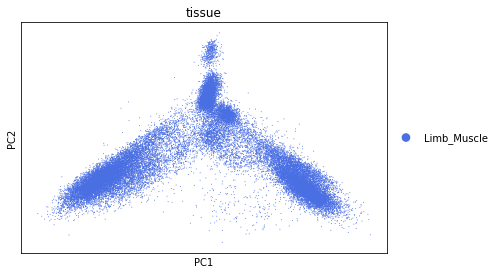

In [25]:
ax = sc.pl.pca_scatter(tiss, color=['tissue'], right_margin=0.5)

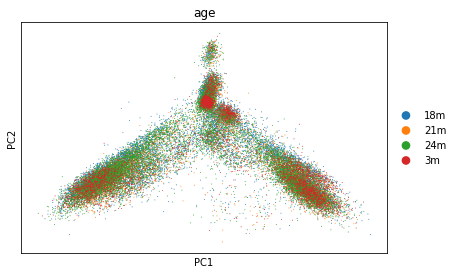

In [26]:
ax = sc.pl.pca_scatter(tiss, color=['age'], right_margin=0.5)

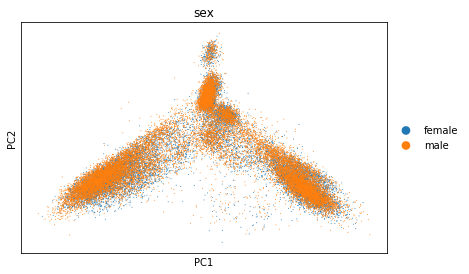

In [27]:
ax = sc.pl.pca_scatter(tiss, color=['sex'], right_margin=0.5)

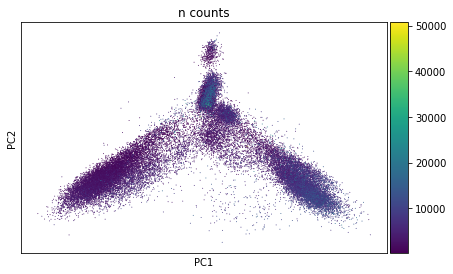

In [28]:
ax = sc.pl.pca_scatter(tiss, color='n_counts', right_margin=0.5)

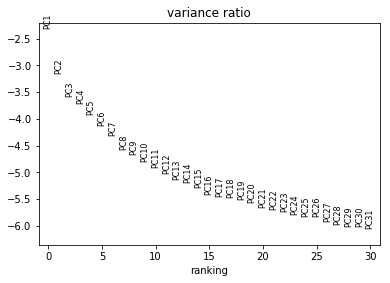

In [29]:
sc.pl.pca_variance_ratio(tiss, log=True)

## Louvain clustering

In [321]:
sc.pp.neighbors(tiss, n_neighbors=12)#, method='gauss')
sc.tl.louvain(tiss, resolution = 0.2)

In [322]:
tiss

AnnData object with n_obs × n_vars = 33993 × 2202 
    obs: 'tissue', 'subtissue', 'age', 'sex', 'n_genes', 'channel', 'cell_ontology_class', 'batch', 'cell', 'method', 'n_counts', 'louvain', 'free_annotation', 'cluster_names'
    var: 'n_cells'
    uns: 'age_colors', 'louvain', 'louvain_colors', 'method_colors', 'neighbors', 'pca', 'sex_colors', 'tissue_colors', 'cell_ontology_class_colors', 'free_annotation_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

## UMAP

In [323]:
sc.tl.umap(tiss)

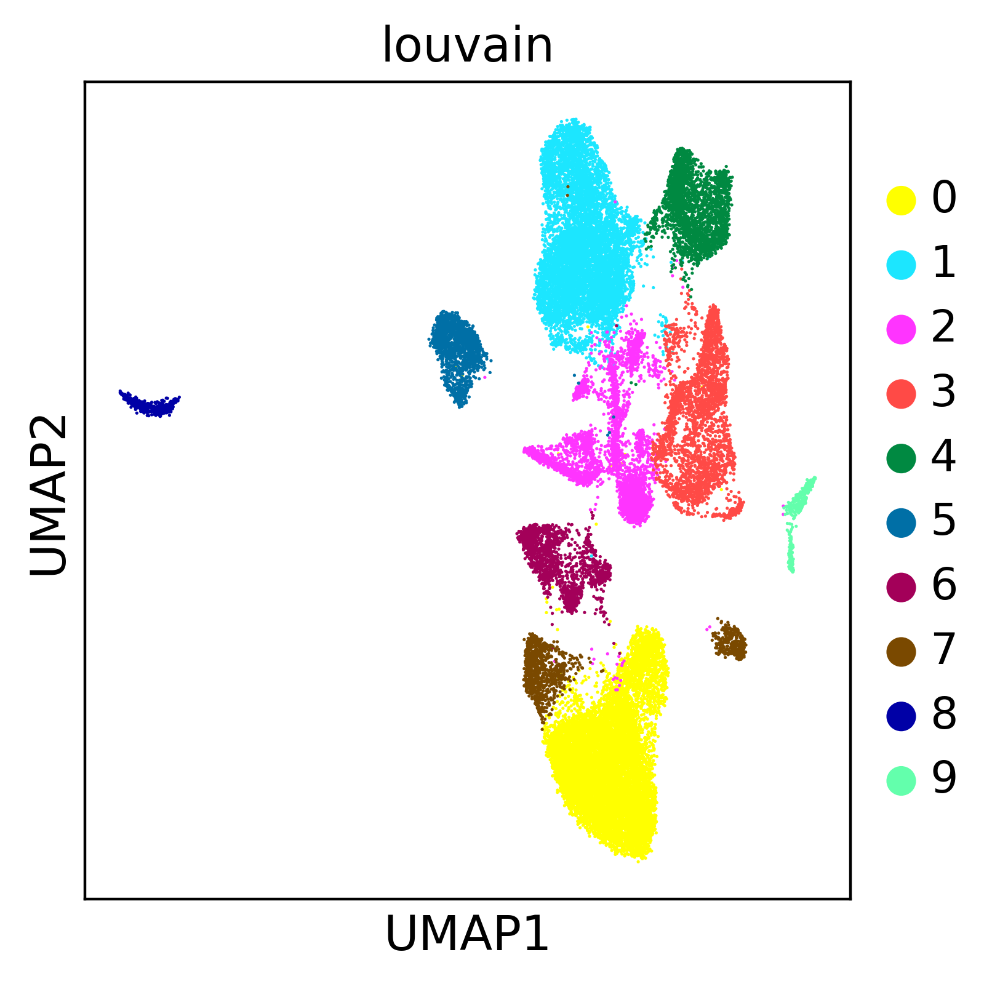

In [280]:
sc.settings.set_figure_params(dpi=200)

sc.pl.umap(tiss, color=['tissue'], right_margin=0.5)#, save = '_'+ str(tissofinterest) +'_all-ages_droplet_tissue.pdf')

saving figure to file ./figures/umap_Limb_Muscle_all-ages_droplet_louvain.pdf


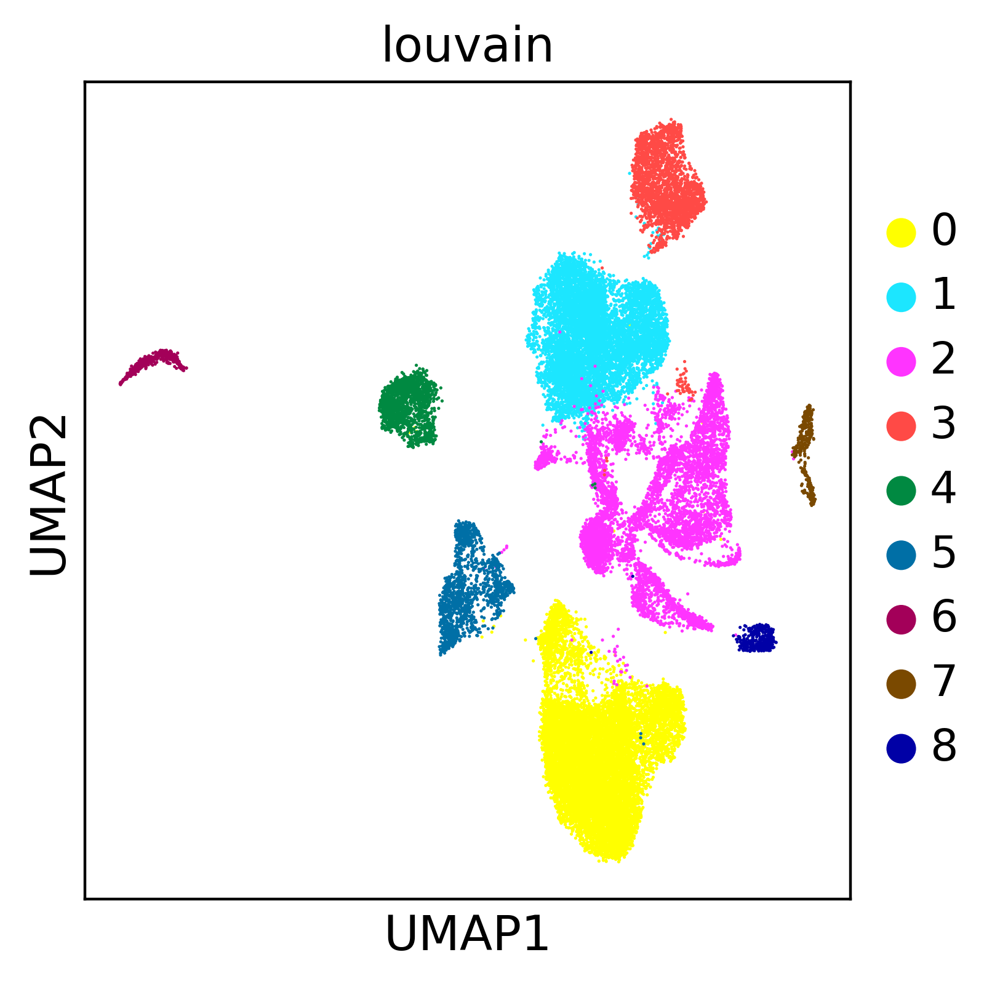

In [260]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss, color=['louvain'], right_margin=0.5, save = '_'+ str(tissofinterest) +'_all-ages_droplet_louvain.pdf')

saving figure to file ./figures/umap_Limb_Muscle_all-ages_droplet_age.pdf


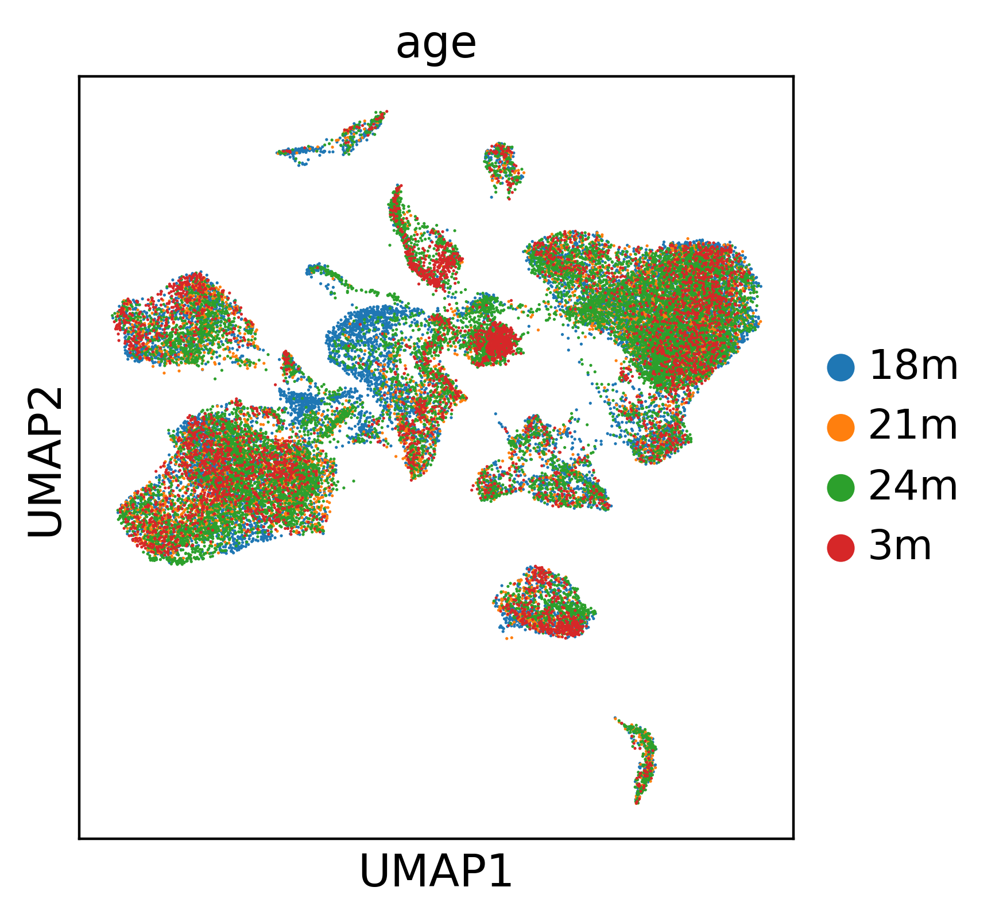

In [35]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss, color=['age'], right_margin=0.5, save = '_'+ str(tissofinterest) +'_all-ages_droplet_age.pdf')

## tSNE

In [100]:
sc.tl.tsne(tiss, perplexity=50)

saving figure to file ./figures/tsne_Limb_Muscle_all-ages_droplet_tissue.pdf


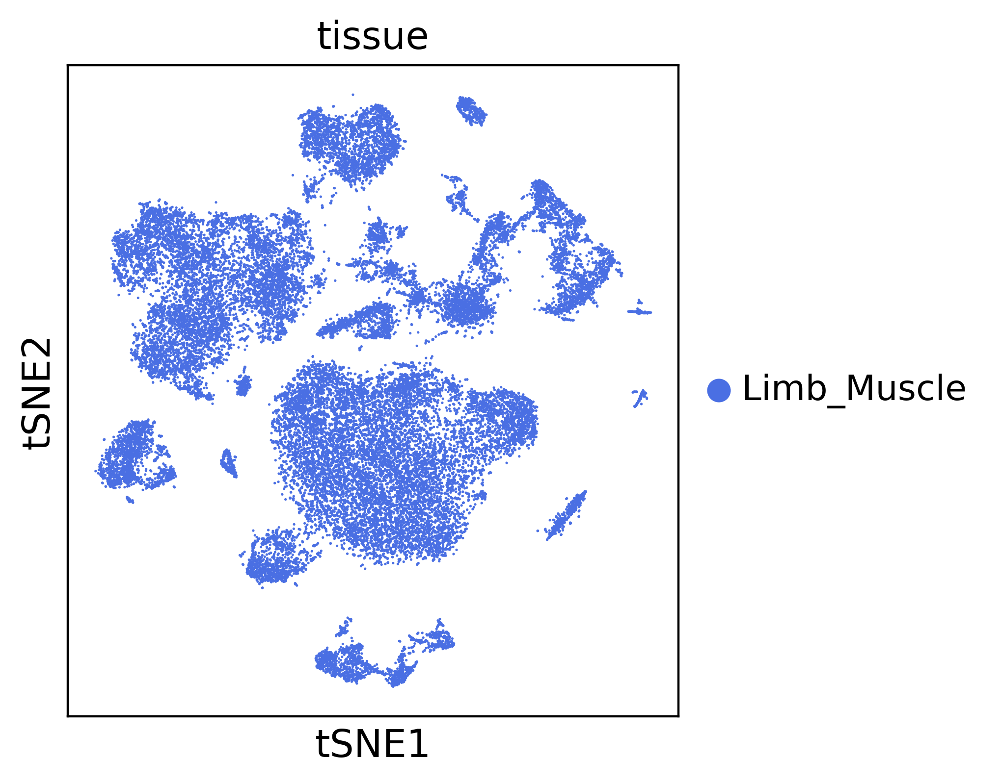

In [101]:
sc.settings.set_figure_params(dpi=200)
sc.pl.tsne(tiss, color=['tissue'], right_margin=0.5, save = '_'+ str(tissofinterest) +'_all-ages_droplet_tissue.pdf')

saving figure to file ./figures/tsne_Limb_Muscle_all-ages_droplet_sex.pdf


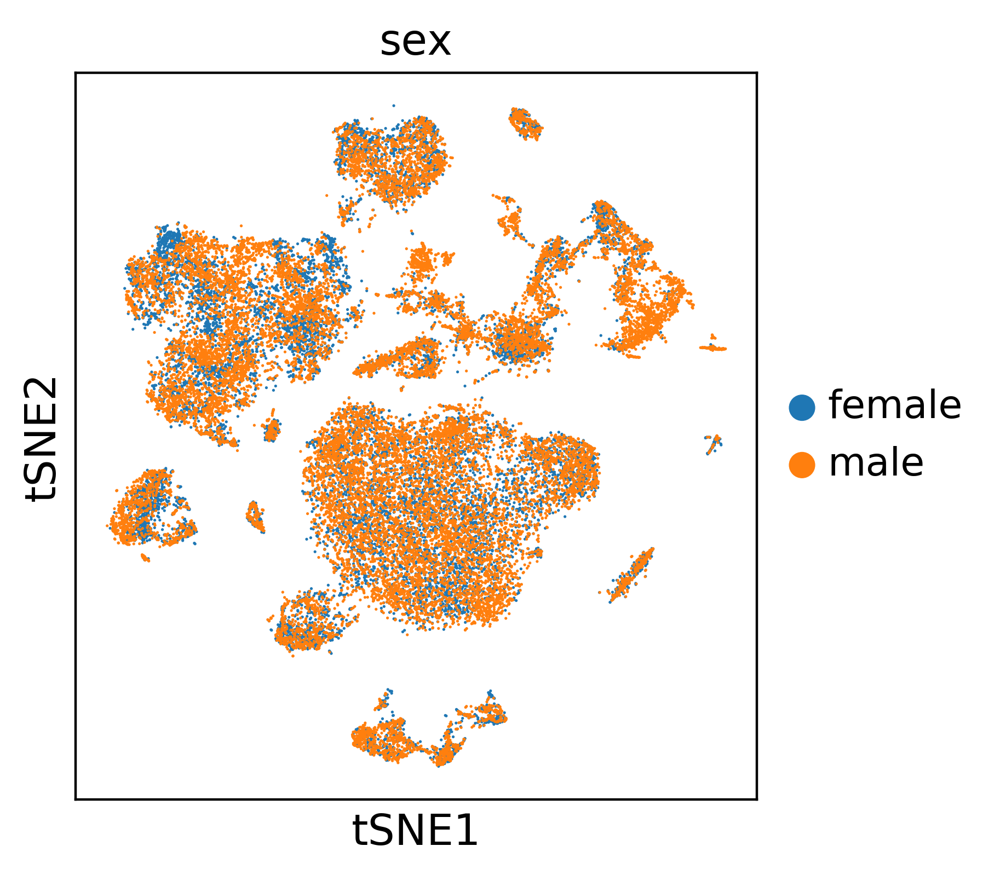

In [102]:
sc.pl.tsne(tiss, color=['sex'], right_margin=0.5, save = '_'+ str(tissofinterest) +'_all-ages_droplet_sex.pdf')

saving figure to file ./figures/tsne_Limb_Muscle_all-ages_droplet_age.pdf


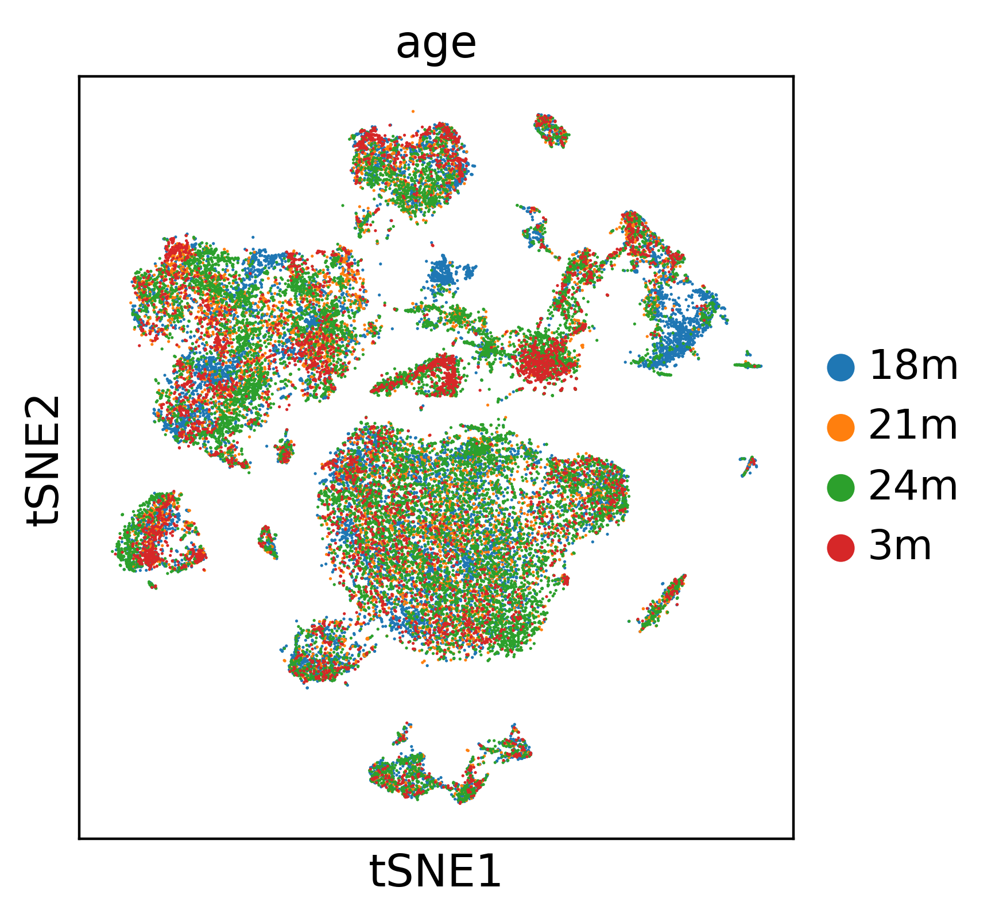

In [103]:
sc.pl.tsne(tiss, color=['age'], right_margin=0.5, save = '_'+ str(tissofinterest) +'_all-ages_droplet_age.pdf')

saving figure to file ./figures/tsne_Limb_Muscle_all-ages_droplet_louvain.pdf


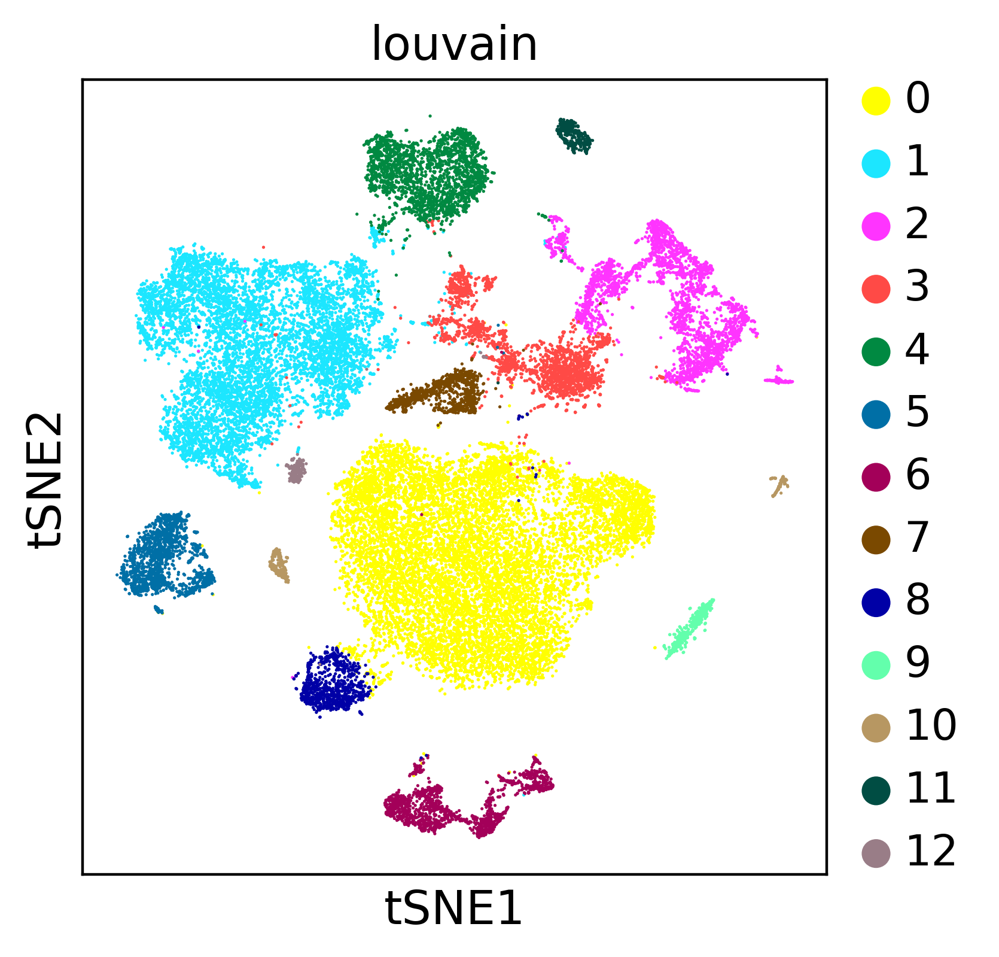

In [104]:
sc.pl.tsne(tiss, color=['louvain'],right_margin=0.5, save = '_'+ str(tissofinterest) +'_all-ages_droplet_louvain.pdf')

## read the annotations from tabula muris

In [36]:
maca10x3metadata2 = pd.read_csv('/data/maca/data/10x/TM_droplet_metadata.csv', low_memory=False)
#maca10x3metadata2 = maca10x3metadata2.rename(columns = {'cell':'Cell'})
len(maca10x3metadata2)

70118

In [37]:
ageofinterest = "3m"
tissage = tiss[tiss.obs['age'] == ageofinterest,:]
tissage

View of AnnData object with n_obs × n_vars = 4542 × 2202 
    obs: 'tissue', 'subtissue', 'age', 'sex', 'n_genes', 'channel', 'cell_ontology_class', 'batch', 'cell', 'method', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'age_colors', 'louvain', 'louvain_colors', 'method_colors', 'neighbors', 'pca', 'sex_colors', 'tissue_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

In [38]:
# methodofinterest = "droplet"
# tissage = tiss[tiss.obs['method'] == methodofinterest,:]
# tissage

In [39]:
tissage.obs.head()

,tissue,subtissue,age,sex,n_genes,channel,cell_ontology_class,batch,cell,method,n_counts,louvain
index,,,,,,,,,,,,
AAACCTGCAGGTCCAC-1-23-1,Limb_Muscle,MUSCLE-56,3m,female,1934,10X_P7_14,NA,1,10X_P7_14_AAACCTGCAGGTCCAC,droplet,6372.0,8
AAACCTGCATCAGTAC-1-23-1,Limb_Muscle,MUSCLE-56,3m,female,925,10X_P7_14,NA,1,10X_P7_14_AAACCTGCATCAGTAC,droplet,1825.0,0
AAACCTGGTGCCTGGT-1-23-1,Limb_Muscle,MUSCLE-56,3m,female,1436,10X_P7_14,NA,1,10X_P7_14_AAACCTGGTGCCTGGT,droplet,3907.0,6
AAACCTGGTTATCACG-1-23-1,Limb_Muscle,MUSCLE-56,3m,female,948,10X_P7_14,NA,1,10X_P7_14_AAACCTGGTTATCACG,droplet,2527.0,7
AAACCTGTCCCAGGTG-1-23-1,Limb_Muscle,MUSCLE-56,3m,female,861,10X_P7_14,NA,1,10X_P7_14_AAACCTGTCCCAGGTG,droplet,2458.0,3


In [40]:
maca10x3metadata2.head()

,cell,channel,mouse.id,tissue,subtissue,mouse.sex,method,cell_ontology_class,cell_ontology_id,free_annotation
0,10X_P4_0_AAACCTGAGATTACCC,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,basal cell of epidermis,CL:0002187,proliferating
1,10X_P4_0_AAACCTGAGTGCCAGA,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,keratinocyte,CL:0000312,differentiated
2,10X_P4_0_AAACCTGCAAATCCGT,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,keratinocyte,CL:0000312,suprabasal differentiating
3,10X_P4_0_AAACCTGGTAATCGTC,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,basal cell of epidermis,CL:0002187,basal cells
4,10X_P4_0_AAACCTGGTCCAACTA,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,basal cell of epidermis,CL:0002187,proliferating


In [41]:
merged_left = pd.merge(left=tissage.obs,right=maca10x3metadata2, left_on='cell', right_on='cell',how = 'inner')

merged_left.head()

#create a list of column headings
cols = list(merged_left.columns)

In [42]:
cols

['tissue_x',
 'subtissue_x',
 'age',
 'sex',
 'n_genes',
 'channel_x',
 'cell_ontology_class_x',
 'batch',
 'cell',
 'method_x',
 'n_counts',
 'louvain',
 'channel_y',
 'mouse.id',
 'tissue_y',
 'subtissue_y',
 'mouse.sex',
 'method_y',
 'cell_ontology_class_y',
 'cell_ontology_id',
 'free_annotation']

In [43]:
# merged_inner = pd.merge(left=tissage.obs,right=maca10x3metadata2, left_on='cell', right_on='cell')
# #merged_inner = merged_inner[['Age','Cell','Channel','Sex','Tissue','batch','n_genes','n_counts','cell_ontology_class','free_annotation']]
# merged_inner.head()

In [44]:
tissage.obs["cell_ontology_class"] = merged_left["cell_ontology_class_y"]
tissage.obs["cell_ontology_id"] = merged_left["cell_ontology_id"]
tissage.obs["free_annotation"] = merged_left["free_annotation"]
display(set(tissage.obs['cell_ontology_class']))

tissage.obs = tissage.obs.reset_index()
tissage.obs["cell_ontology_class"] = merged_left["cell_ontology_class_y"]
tissage.obs["cell_ontology_id"] = merged_left["cell_ontology_id"]
tissage.obs["free_annotation"] = merged_left["free_annotation"]
set(tissage.obs['cell_ontology_class'])


{nan}

{'B cell',
 'T cell',
 'endothelial cell',
 'macrophage',
 'mesenchymal stem cell',
 nan,
 'skeletal muscle satellite cell'}

In [45]:
# tissage.obs = tissage.obs.reset_index()

In [46]:
# tissage.obs["cell_ontology_class"] = merged_inner["cell_ontology_class"]
# tissage.obs["free_annotation"] = merged_inner["free_annotation"]
# tissage.obs

In [47]:
# tissage.obs.head()

In [48]:
#sc.tl.pca(tissage)
#sc.pp.neighbors(tissage, n_neighbors=15)#, method='gauss')
#sc.tl.louvain(tissage, resolution = 0.3)
#sc.tl.tsne(tissage, perplexity=50)

... storing 'cell_ontology_class' as categorical
... storing 'cell_ontology_id' as categorical
... storing 'free_annotation' as categorical
saving figure to file ./figures/umap_Limb_Muscle_3m_droplet_louvain.pdf


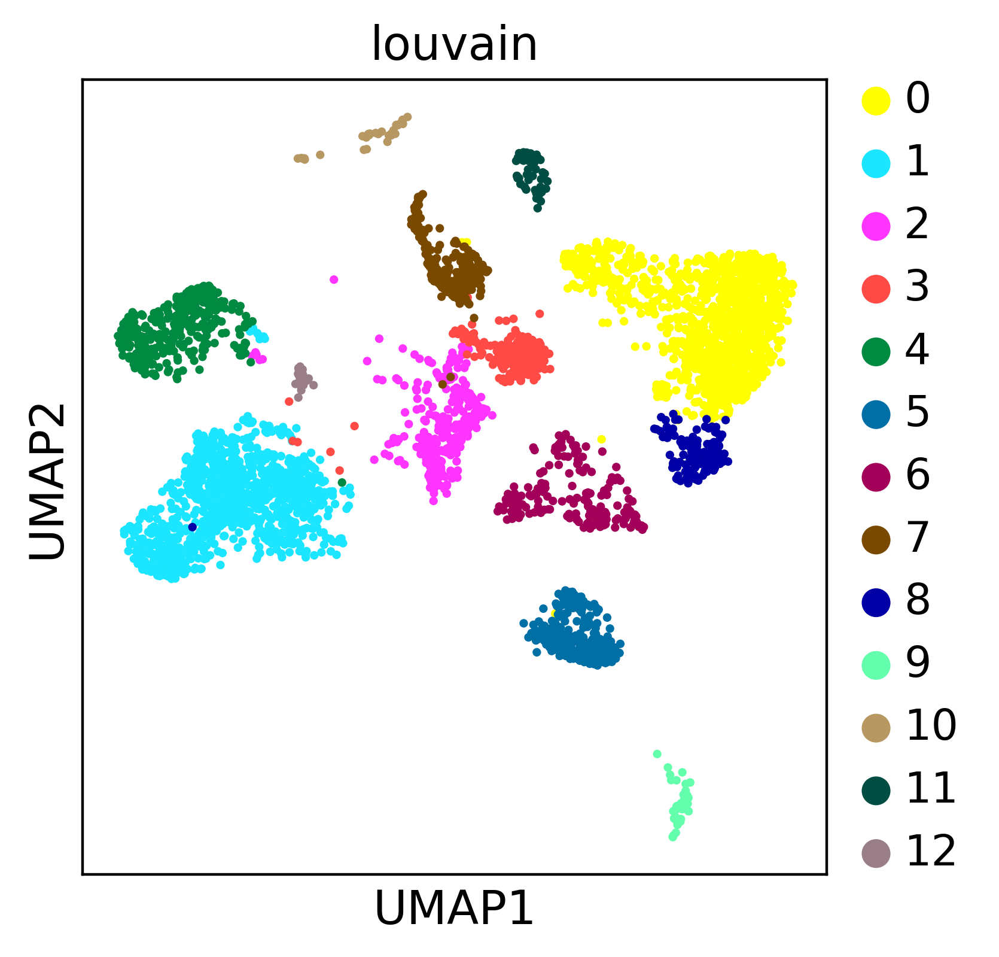

In [49]:
sc.pl.umap(tissage, color=['louvain'],right_margin=0.5, save = '_'+ str(tissofinterest) +'_3m_droplet_louvain.pdf')

saving figure to file ./figures/umap_Limb_Muscle_3m_droplet_cell-ontology-class.pdf


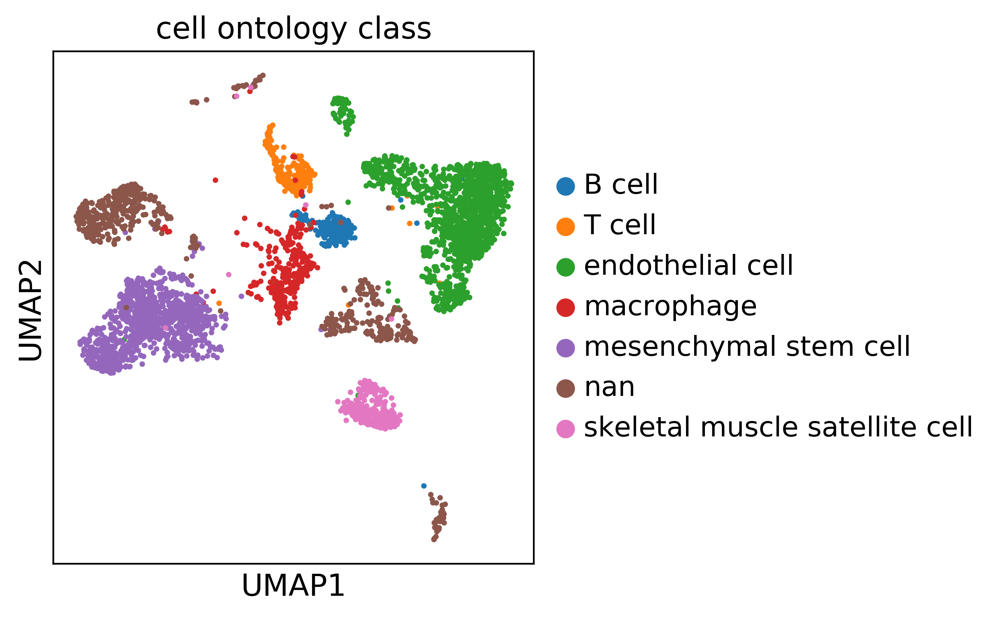

In [50]:
sc.pl.umap(tissage, color=['cell_ontology_class'],right_margin=0.5, save = '_'+ str(tissofinterest) +'_3m_droplet_cell-ontology-class.pdf')

saving figure to file ./figures/umap_Limb_Muscle_3m_droplet_free-annotation.pdf


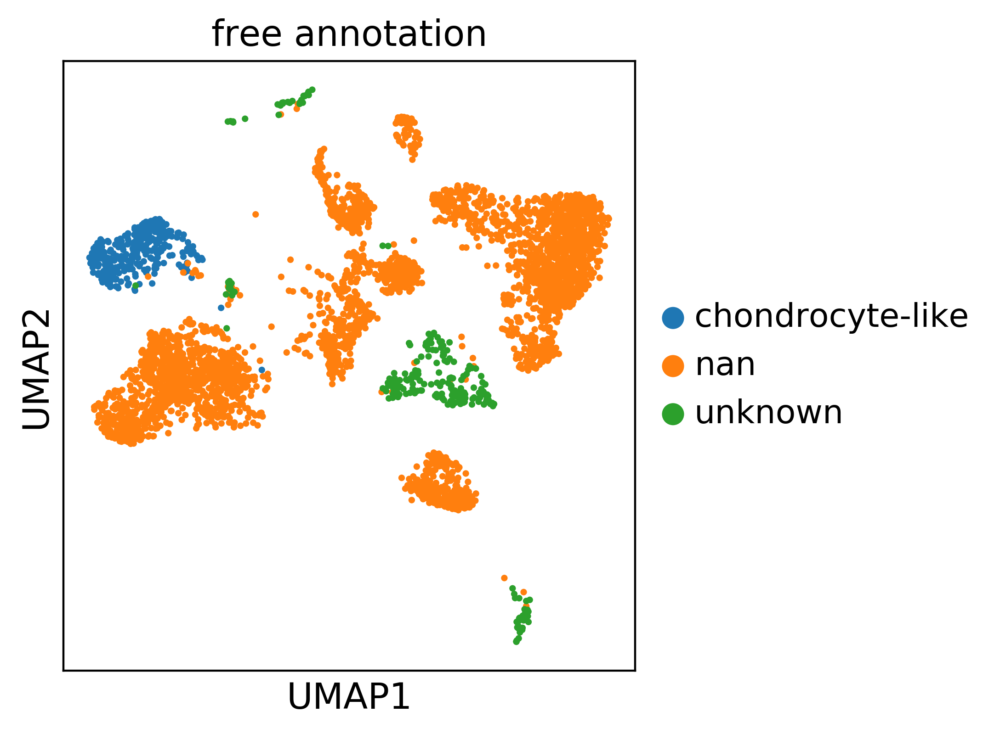

In [51]:
sc.pl.umap(tissage, color=['free_annotation'],right_margin=0.5, save = '_'+ str(tissofinterest) +'_3m_droplet_free-annotation.pdf')

In [242]:
df = tissage.obs[tissage.obs['louvain'].str.match('12')]['cell_ontology_class']
df.reset_index()
df = df.reset_index()
display(df.groupby('cell_ontology_class').count())
display(df.groupby('cell_ontology_class').count().sum())
display(df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum())
dfaux = df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
dfaux.reset_index()
dfaux = dfaux.reset_index()
display(dfaux[dfaux['index']>0.95][['cell_ontology_class']])
#dfdf.sum()
#df.drop_duplicates()
#tissage.obs['louvain']
#val = dfaux[dfaux['index']>0.95][['cell_ontology_class']].values[0]
#print(val)

,index
cell_ontology_class,
B cell,0
T cell,0
endothelial cell,0
macrophage,0
mesenchymal stem cell,11
nan,13
skeletal muscle satellite cell,0


index    24
dtype: int64

,index
cell_ontology_class,
B cell,0.000000
T cell,0.000000
endothelial cell,0.000000
macrophage,0.000000
mesenchymal stem cell,0.458333
nan,0.541667
skeletal muscle satellite cell,0.000000


,cell_ontology_class


In [241]:
tiss_cell_ontology_class = {}
for i in range(0,tissage.obs['louvain'].nunique()):
    df = tissage.obs[tissage.obs['louvain'].str.match(str(i))]['cell_ontology_class']
    df.reset_index()
    df = df.reset_index()
    #df.groupby('cell_ontology_class').count()
    #df.groupby('cell_ontology_class').count().sum()
    #df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
    dfaux = df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
    dfaux.reset_index()
    dfaux = dfaux.reset_index()
    #display(dfaux[dfaux['index']>0.95][['cell_ontology_class']])
    #dfdfaux = pd.concat([dfdfaux,dfaux[dfaux['index']>0.95][['cell_ontology_class']]])
    a = dfaux[dfaux['index']>0.90][['cell_ontology_class']]
    if a.empty:
        tiss_cell_ontology_class[i] = 'tbc'
    else:
        tiss_cell_ontology_class[i] = a.values[0][0]

tiss_cell_ontology_class



{0: 'endothelial cell',
 1: 'mesenchymal stem cell',
 2: 'macrophage',
 3: 'B cell',
 4: 'nan',
 5: 'skeletal muscle satellite cell',
 6: 'nan',
 7: 'T cell',
 8: 'endothelial cell',
 9: 'nan',
 10: 'nan',
 11: 'endothelial cell',
 12: 'tbc'}

In [243]:
tiss_free_annotation = {}
for i in range(0,tissage.obs['louvain'].nunique()):
    df = tissage.obs[tissage.obs['louvain'].str.match(str(i))]['free_annotation']
    df.reset_index()
    df = df.reset_index()
    #df.groupby('cell_ontology_class').count()
    #df.groupby('cell_ontology_class').count().sum()
    #df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
    dfaux = df.groupby('free_annotation').count()/df.groupby('free_annotation').count().sum()
    dfaux.reset_index()
    dfaux = dfaux.reset_index()
    #display(dfaux[dfaux['index']>0.95][['cell_ontology_class']])
    #dfdfaux = pd.concat([dfdfaux,dfaux[dfaux['index']>0.95][['cell_ontology_class']]])
    a = dfaux[dfaux['index']>0.90][['free_annotation']]
    if a.empty:
        tiss_free_annotation[i] = 'nan'
    else:
        tiss_free_annotation[i] = a.values[0][0]

tiss_free_annotation


{0: 'nan',
 1: 'nan',
 2: 'nan',
 3: 'nan',
 4: 'chondrocyte-like',
 5: 'nan',
 6: 'unknown',
 7: 'nan',
 8: 'nan',
 9: 'unknown',
 10: 'unknown',
 11: 'nan',
 12: 'nan'}

In [244]:
tiss.obs['louvain'] = tiss.obs['louvain'].apply(pd.to_numeric)
tiss.obs['cell_ontology_class'] = tiss.obs['louvain'].map(tiss_cell_ontology_class)
tiss.obs.head()

,tissue,subtissue,age,sex,n_genes,channel,cell_ontology_class,batch,cell,method,n_counts,louvain,free_annotation,cluster_names
index,,,,,,,,,,,,,,
AAACCTGAGAAACCGC-1-14-0,Limb_Muscle,Pre-Sort,18m,female,2506,MACA_18m_F_MUSCLE_50_pre_sort,macrophage,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGAGAAACCGC,droplet,7596.0,2,nan,macrophage_2
AAACCTGAGCAGCGTA-1-14-0,Limb_Muscle,Pre-Sort,18m,female,564,MACA_18m_F_MUSCLE_50_pre_sort,endothelial cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGAGCAGCGTA,droplet,890.0,0,nan,endothelial cell_0
AAACCTGCAATAACGA-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1361,MACA_18m_F_MUSCLE_50_pre_sort,endothelial cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGCAATAACGA,droplet,3351.0,0,nan,endothelial cell_0
AAACCTGCAGCGTAAG-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1482,MACA_18m_F_MUSCLE_50_pre_sort,nan,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGCAGCGTAAG,droplet,4630.0,4,chondrocyte-like,cluster4
AAACCTGGTAGCTTGT-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1652,MACA_18m_F_MUSCLE_50_pre_sort,mesenchymal stem cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGGTAGCTTGT,droplet,3838.0,1,nan,cluster1


In [245]:
tiss.obs['free_annotation'] = tiss.obs['louvain'].map(tiss_free_annotation)
tiss.obs.head()

,tissue,subtissue,age,sex,n_genes,channel,cell_ontology_class,batch,cell,method,n_counts,louvain,free_annotation,cluster_names
index,,,,,,,,,,,,,,
AAACCTGAGAAACCGC-1-14-0,Limb_Muscle,Pre-Sort,18m,female,2506,MACA_18m_F_MUSCLE_50_pre_sort,macrophage,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGAGAAACCGC,droplet,7596.0,2,nan,macrophage_2
AAACCTGAGCAGCGTA-1-14-0,Limb_Muscle,Pre-Sort,18m,female,564,MACA_18m_F_MUSCLE_50_pre_sort,endothelial cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGAGCAGCGTA,droplet,890.0,0,nan,endothelial cell_0
AAACCTGCAATAACGA-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1361,MACA_18m_F_MUSCLE_50_pre_sort,endothelial cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGCAATAACGA,droplet,3351.0,0,nan,endothelial cell_0
AAACCTGCAGCGTAAG-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1482,MACA_18m_F_MUSCLE_50_pre_sort,nan,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGCAGCGTAAG,droplet,4630.0,4,chondrocyte-like,cluster4
AAACCTGGTAGCTTGT-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1652,MACA_18m_F_MUSCLE_50_pre_sort,mesenchymal stem cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGGTAGCTTGT,droplet,3838.0,1,nan,cluster1


... storing 'cell_ontology_class' as categorical
... storing 'free_annotation' as categorical


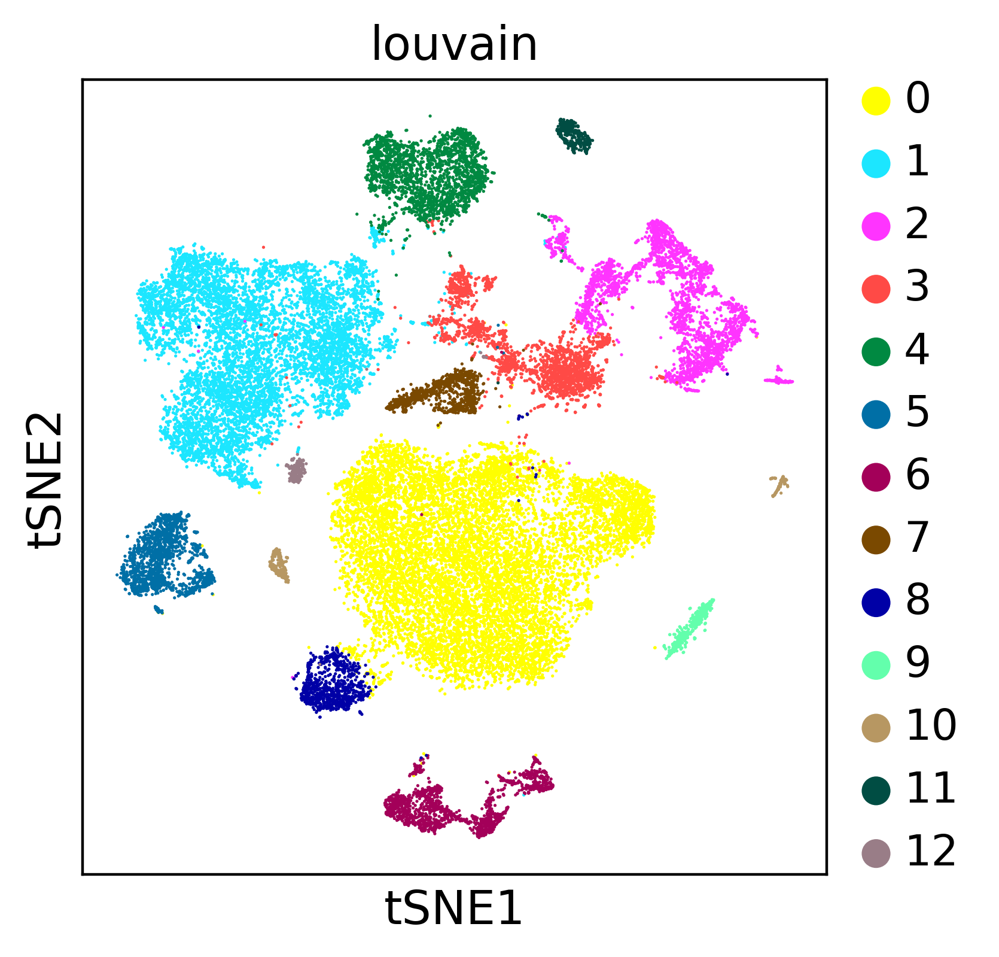

In [246]:
sc.pl.tsne(tiss, color=['louvain'],right_margin=0.5)

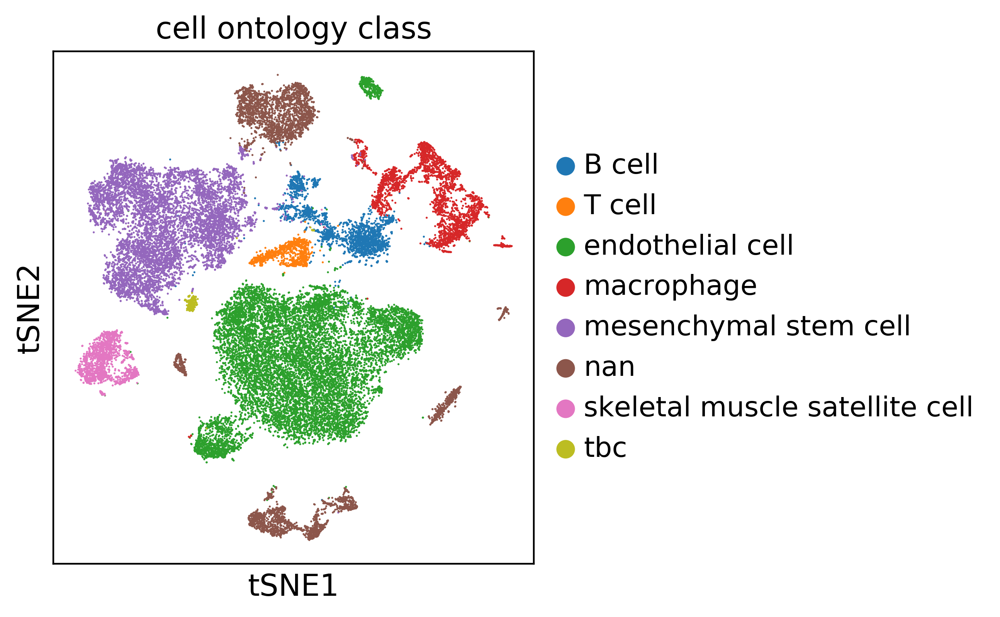

In [247]:
sc.pl.tsne(tiss, color=['cell_ontology_class'],right_margin=0.5)

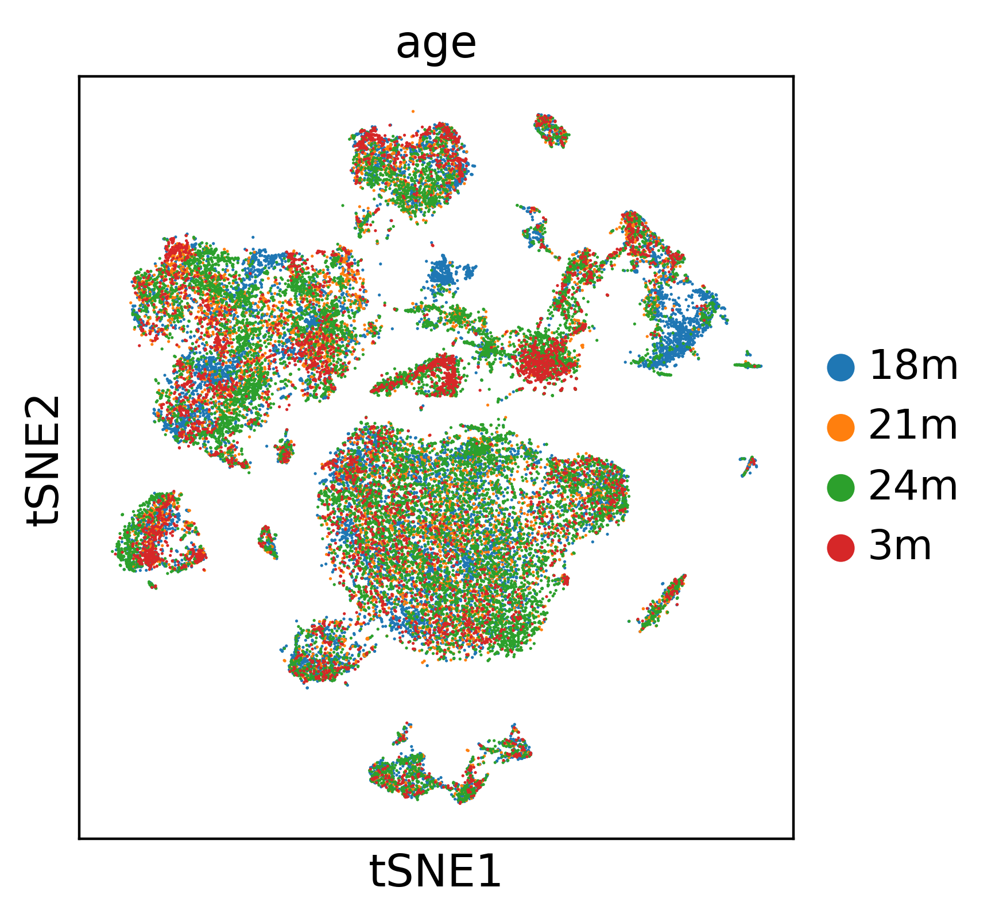

In [248]:
sc.pl.tsne(tiss, color=['age'],right_margin=0.5)

saving figure to file ./figures/umap_Limb_Muscle_all_ages_droplet_louvain.pdf


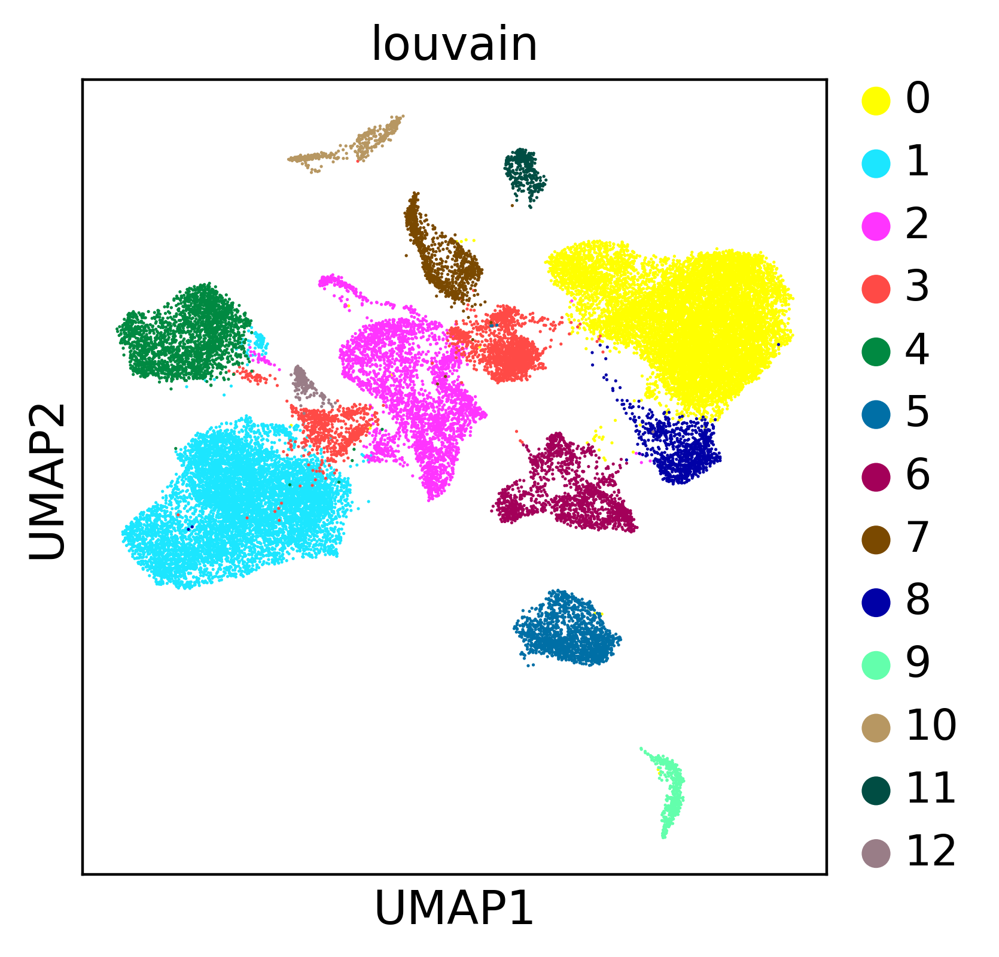

In [252]:
sc.pl.umap(tiss, color=['louvain'],right_margin=0.5, save = '_'+ str(tissofinterest) + '_all_ages_droplet_louvain.pdf')

saving figure to file ./figures/umap_Limb_Muscle_all_ages_droplet_cell_ontology_class.pdf


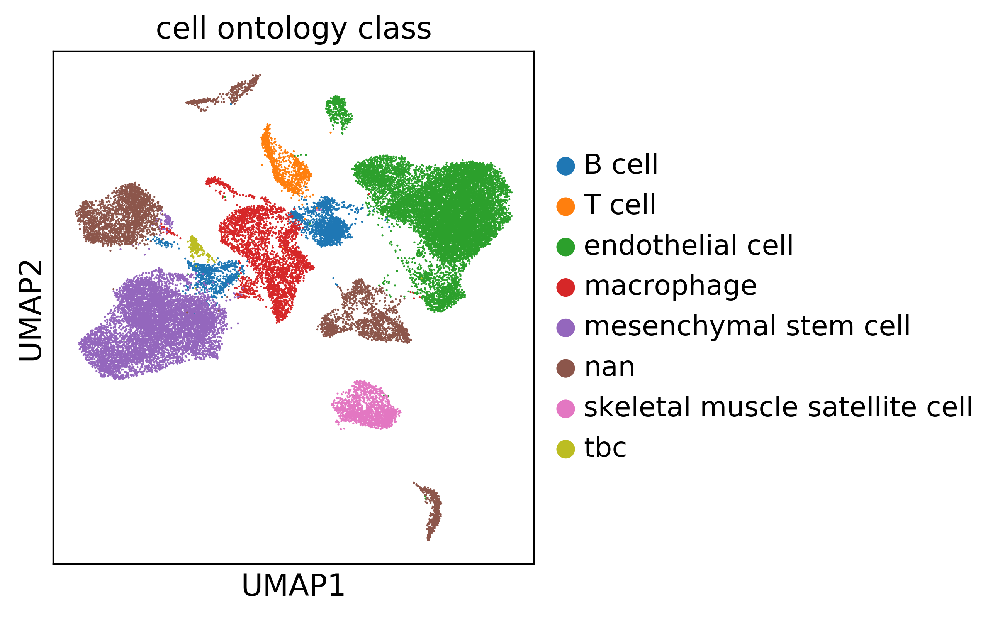

In [249]:
sc.pl.umap(tiss, color=['cell_ontology_class'],right_margin=0.5, save = '_'+ str(tissofinterest) + '_all_ages_droplet_cell_ontology_class.pdf')

saving figure to file ./figures/umap_Limb_Muscle_all_ages_droplet_free-annotation.pdf


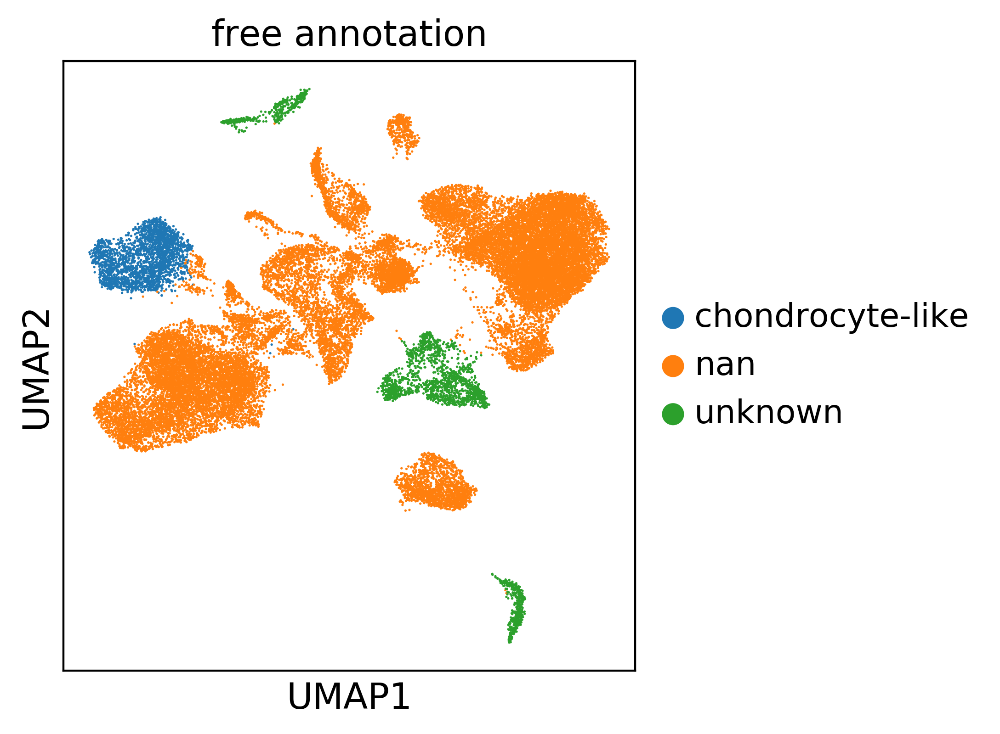

In [250]:
sc.pl.umap(tiss, color=['free_annotation'],right_margin=0.5, save = '_'+ str(tissofinterest) + '_all_ages_droplet_free-annotation.pdf')

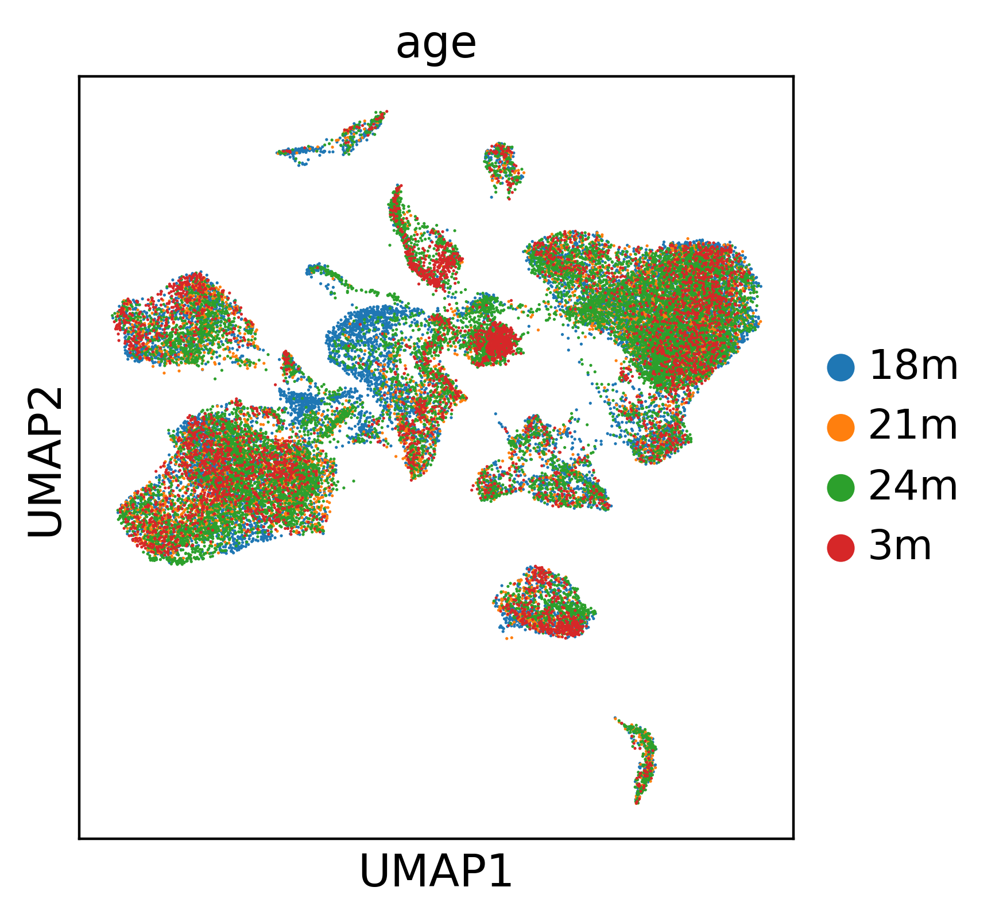

In [251]:
sc.pl.umap(tiss, color=['age'],right_margin=0.5)

In [63]:
# def plot_boxplot_nonzero(adata, gene, label):
#     gene_vals = np.asarray(adata[:, gene].X).flatten()

#     labels = sorted(set(adata.obs[label]))
    
#     props = {'color': 'k', 'linewidth': 1, 'linestyle': 'solid'}
#     bprops = {'facecolor': '#FFFFFF', 'color': 'k', 'linewidth': 1}

    
#     val_groups = [gene_vals[adata.obs[label] == lbl] for lbl in labels]
#     val_groups = [vg[vg > 0] for vg in val_groups]

#     patches = plt.boxplot(val_groups, labels=labels, vert=False,
#                           whis=[5,95],
#                      showfliers=False, widths=0.6,
#                      boxprops=bprops, whiskerprops=props,
#                      capprops=props, medianprops=props, patch_artist=True)
#     for bp in patches['boxes']:
#         bp.fill = False
    

#     x,y = zip(*[(v,1+j) for j,vs in enumerate(val_groups) for v in vs])
#     x = np.array(x)
#     plt.scatter(x, y+ np.random.normal(scale=0.05, size=x.shape[0]),
#               color=['bg'[(i % 2)] for i,vs in enumerate(val_groups) for v in vs],
#               alpha=0.2, linewidths=0, s=20, zorder=-1)

    
#     plt.show()
    
    
# def plot_boxplot_nonzero(adata, gene, label):
#     gene_vals = np.asarray(adata[:, gene].X).flatten()

#     labels = sorted(set(adata.obs[label]))
    
#     props = {'color': 'k', 'linewidth': 1, 'linestyle': 'solid'}
#     bprops = {'facecolor': '#FFFFFF', 'color': 'k', 'linewidth': 1}

    
#     val_groups = [gene_vals[adata.obs[label] == lbl] for lbl in labels]
        
#     n_cells = [len(vg) for vg in val_groups]
#     means = [np.mean(vg) if len(vg) else 0.0 for vg in val_groups]
#     medians = [np.median(vg) if len(vg) else 0.0 for vg in val_groups]
    
#     val_groups = [vg[vg > 0] for vg in val_groups]
#     medians_gt0 = [np.median(vg) if len(vg) else 0.0 for vg in val_groups]
    
#     percent_0 = [((nc - len(vg)) / nc) if nc else 1.0 for vg,nc in zip(val_groups, n_cells)]
#     percent_gt0 = [(len(vg) / nc) if nc else 0.0  for vg,nc in zip(val_groups, n_cells)]
    
#     patches = plt.boxplot(val_groups, labels=labels, vert=False,
#                           whis=[5,95],
#                      showfliers=False, widths=0.6,
#                      boxprops=bprops, whiskerprops=props,
#                      capprops=props, medianprops=props, patch_artist=True)
#     for bp in patches['boxes']:
#         bp.fill = False
    

#     x,y = zip(*[(v,1+j) for j,vs in enumerate(val_groups) for v in vs])
#     x = np.array(x)
#     plt.scatter(x, y+ np.random.normal(scale=0.05, size=x.shape[0]),
#               color=['bg'[(i % 2)] for i,vs in enumerate(val_groups) for v in vs],
#               alpha=0.2, linewidths=0, s=20, zorder=-1)

    
#     plt.show()

#     return {'n_cells': n_cells,
#             'means': means,
#             'medians': medians,
#             'medians_gt0': medians_gt0,
#             'percent_0': percent_0,
#             'percent_gt0': percent_gt0}


    
    
def plot_boxplot_nonzero(adata, gene, label, ax, show=True):
    gene_vals = np.asarray(adata[:, gene].X).flatten()

    labels = sorted(set(adata.obs[label]))
    
    props = {'color': 'k', 'linewidth': 1, 'linestyle': 'solid'}
    bprops = {'facecolor': '#FFFFFF', 'color': 'k', 'linewidth': 1}

    
    val_groups = [gene_vals[adata.obs[label] == lbl] for lbl in labels]
        
    n_cells = [len(vg) for vg in val_groups]
    means = [np.mean(vg) if len(vg) else 0.0 for vg in val_groups]
    medians = [np.median(vg) if len(vg) else 0.0 for vg in val_groups]
    
    val_groups = [vg[vg > 0] for vg in val_groups]
    medians_gt0 = [np.median(vg) if len(vg) else 0.0 for vg in val_groups]
    
    percent_0 = [((nc - len(vg)) / nc) if nc else 1.0 for vg,nc in zip(val_groups, n_cells)]
    percent_gt0 = [(len(vg) / nc) if nc else 0.0  for vg,nc in zip(val_groups, n_cells)]
    
    if ax:
        plt.subplot(ax)
    
    patches = plt.boxplot(val_groups, labels=labels, vert=False,
                          whis=[5,95],
                     showfliers=False, widths=0.6,
                     boxprops=bprops, whiskerprops=props,
                     capprops=props, medianprops=props, patch_artist=True)
    for bp in patches['boxes']:
        bp.fill = False
    

    x,y = zip(*[(v,1+j) for j,vs in enumerate(val_groups) for v in vs])
    x = np.array(x)
    plt.scatter(x, y+ np.random.normal(scale=0.05, size=x.shape[0]),
              color=['bg'[(i % 2)] for i,vs in enumerate(val_groups) for v in vs],
              alpha=0.2, linewidths=0, s=20, zorder=-1)

    
    if show:
        plt.show()
    
    stats = ['# cells', 'mean expression', 'median expression', 
             'median expression for cells that do express', 'fraction of cells non-expressing',
            'fraction of cells expressing']
#     index = list(set(adata.obs[label]))#['3m','18m','21m','24m']

    adata_stats = pd.DataFrame(columns = stats)
    adata_stats = adata_stats.reindex(labels)
    adata_stats['# cells'] = n_cells
    adata_stats['mean expression'] = means
    adata_stats['median expression'] = medians
    adata_stats['median expression for cells that do express'] = medians_gt0
    adata_stats['fraction of cells non-expressing'] = percent_0
    adata_stats['fraction of cells expressing'] = percent_gt0


    return adata_stats


In [98]:
def plot_boxplot_cell_fraction(adata, gene, label, title, ax, show=True):
    gene_vals = np.asarray(adata[:, gene].X).flatten()

    labels = ['3m','18m','21m','24m']#sorted(set(adata.obs[label]))
    
    props = {'color': 'k', 'linewidth': 1, 'linestyle': 'solid'}
    bprops = {'facecolor': '#FFFFFF', 'color': 'k', 'linewidth': 1}

    
    val_groups = [gene_vals[adata.obs[label] == lbl] for lbl in labels]
        
    n_cells = [len(vg) for vg in val_groups]
    means = [np.mean(vg) if len(vg) else 0.0 for vg in val_groups]
    medians = [np.median(vg) if len(vg) else 0.0 for vg in val_groups]
    
    val_groups = [vg[vg > 0] for vg in val_groups]
    medians_gt0 = [np.median(vg) if len(vg) else 0.0 for vg in val_groups]
    
    percent_0 = [((nc - len(vg)) / nc) if nc else 1.0 for vg,nc in zip(val_groups, n_cells)]
    percent_gt0 = [(len(vg) / nc) if nc else 0.0  for vg,nc in zip(val_groups, n_cells)]
    
    if ax:
        plt.subplot(ax)
    
    patches = plt.bar(labels, percent_gt0, align='center', alpha=0.5)
    plt.ylabel('Fraction cells expressing ' + gene)
    plt.title(title)
    
#     plt.boxplot(val_groups, labels=labels, vert=False,
#                           whis=[5,95],
#                      showfliers=False, widths=0.6,
#                      boxprops=bprops, whiskerprops=props,
#                      capprops=props, medianprops=props, patch_artist=True)
#     for bp in patches['boxes']:
#         bp.fill = False
    

#     x,y = zip(*[(v,1+j) for j,vs in enumerate(val_groups) for v in vs])
#     x = np.array(x)
#     plt.scatter(x, y+ np.random.normal(scale=0.05, size=x.shape[0]),
#               color=['bg'[(i % 2)] for i,vs in enumerate(val_groups) for v in vs],
#               alpha=0.2, linewidths=0, s=20, zorder=-1)

    
    if show:
        plt.show()
    
    stats = ['# cells', 'mean expression', 'median expression', 
             'median expression for cells that do express', 'fraction of cells non-expressing',
            'fraction of cells expressing']
#     index = list(set(adata.obs[label]))#['3m','18m','21m','24m']

    adata_stats = pd.DataFrame(columns = stats)
    adata_stats = adata_stats.reindex(labels)
    adata_stats['# cells'] = n_cells
    adata_stats['mean expression'] = means
    adata_stats['median expression'] = medians
    adata_stats['median expression for cells that do express'] = medians_gt0
    adata_stats['fraction of cells non-expressing'] = percent_0
    adata_stats['fraction of cells expressing'] = percent_gt0


    return adata_stats


In [92]:
def _build_subplots(n):
    '''
    Build subplots grid
    n: number of subplots
    '''
    nrow = int(np.sqrt(n))
    ncol = int(np.ceil(n / nrow))
    fig, axs = plt.subplots(nrow, ncol, dpi=100, figsize=(ncol*5, nrow*5))
    fig.tight_layout() 
    fig.subplots_adjust(wspace=.5)

    return fig, axs, nrow, ncol

In [ ]:
ages = ['3m','18m','21m','24m']#

fig, axs, nrow, ncol = _build_subplots(len(ages))

axs = axs.ravel()

for i in range(nrow*ncol):
    age = ages[i]
    axs[i].set_title(ages[i])
    sc.pl.violin(tiss[tiss.obs['age']==ages[i],:], ['Cdkn2a'],
                 groupby='cell_ontology_class', 
                 rotation=90,
                 ax=axs[i],show=False)

In [ ]:
cell_types = list(set(tiss.obs['cell_ontology_class']))

fig, axs, nrow, ncol = _build_subplots(len(cell_types))

axs = axs.ravel()

for i in range(nrow*ncol):
    cell = cell_types[i]
    axs[i].set_title(cell_types[i])
    sc.pl.violin(tiss[tiss.obs['cell_ontology_class']==cell,:], ['Cdkn2a'],
                 groupby='age', 
                 rotation=90,
                 ax=axs[i],show=False)

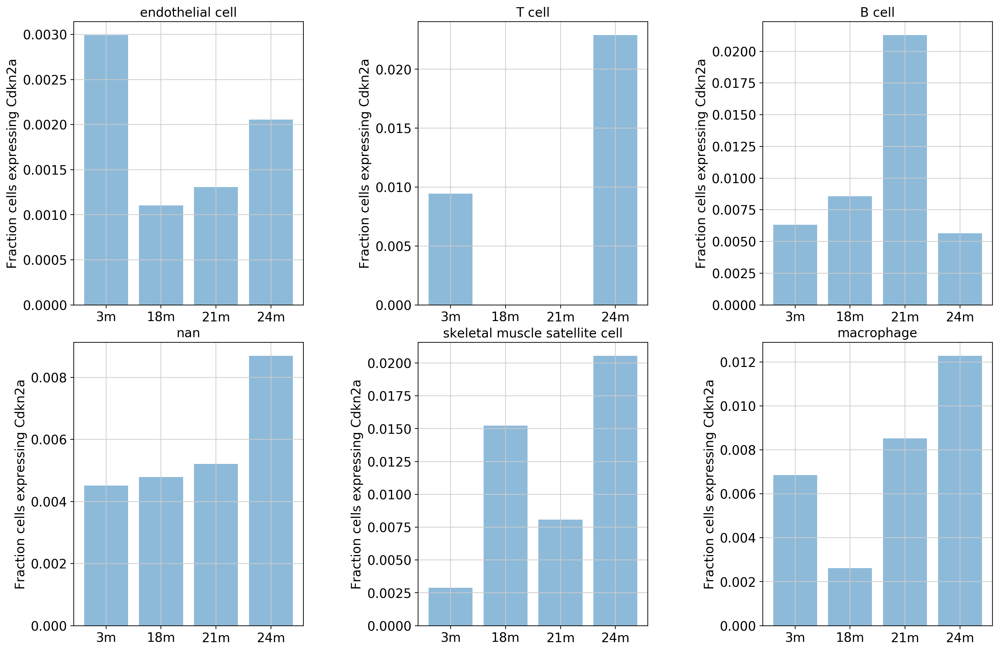

In [95]:
cell_types = list(set(tiss.obs['cell_ontology_class']))

fig, axs, nrow, ncol = _build_subplots(len(cell_types))

axs = axs.ravel()
geneofinterest = 'Cdkn2a'

for i in range(nrow*ncol):
    cell = cell_types[i]
    axs[i].set_title(cell_types[i])
#     plot_boxplot_nonzero(tiss[tiss.obs['cell_ontology_class']==cell,:],geneofinterest,'age',axs[i],show = False)
    plot_boxplot_cell_fraction(tiss[tiss.obs['cell_ontology_class']==cell,:],geneofinterest,'age',cell,axs[i],show = False)

    
    
    
# plt.savefig('figures/' + tissofinterest + '_cell-ontology-class_'+ geneofinterest + '.pdf', bbox_inches='tight')


,# cells,mean expression,median expression,median expression for cells that do express,fraction of cells non-expressing,fraction of cells expressing
3m,4542,0.036021,0.0,7.805024,0.995376,0.004624
18m,11622,0.029152,0.0,7.818141,0.996300,0.003700
21m,5675,0.037384,0.0,8.513444,0.995419,0.004581
24m,12154,0.057499,0.0,8.655056,0.992924,0.007076


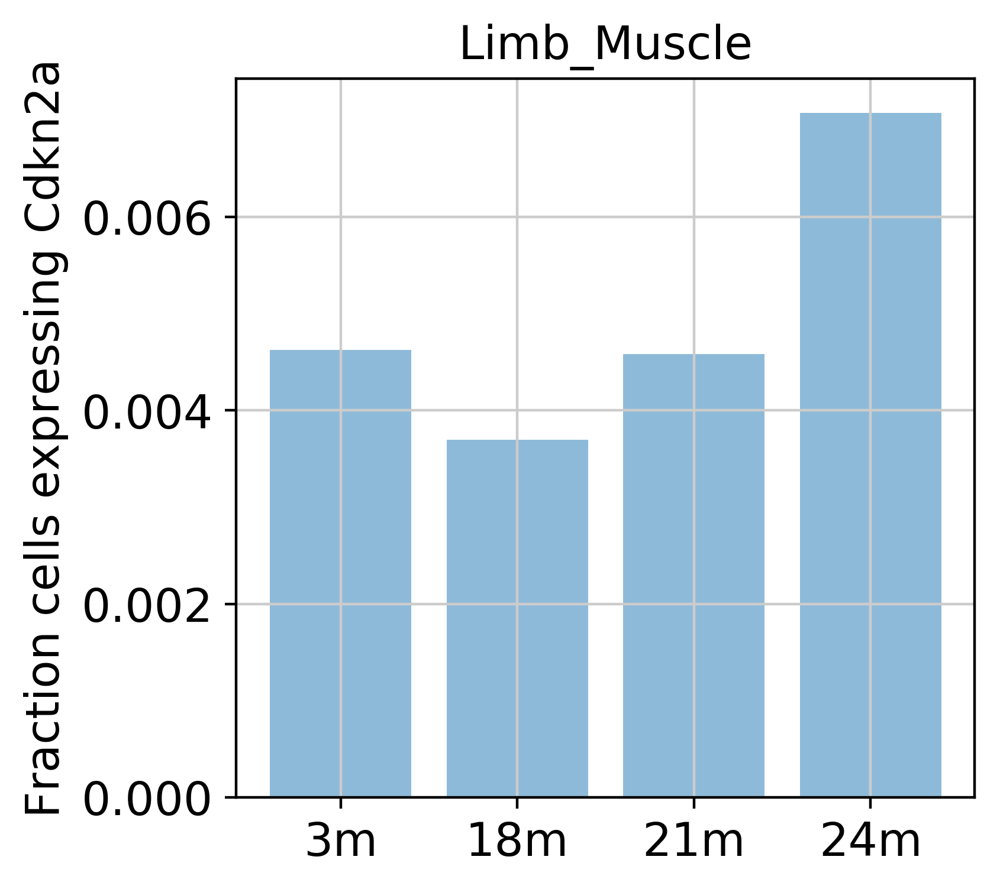

In [99]:
# fig, axs, nrow, ncol = _build_subplots(len(cell_types))
# fig, axs, nrow, ncol = _build_subplots(1)

# axs = axs.ravel()
geneofinterest = 'Cdkn2a'

# for i in range(nrow*ncol):
    
#     axs[i].set_title(tissofinterest)
# tiss_age_stats = plot_boxplot_nonzero(tiss,geneofinterest,'age',ax = False,show = False)

plot_boxplot_cell_fraction(tiss,geneofinterest,'age',tissofinterest,ax = False,show = False)

# plt.savefig('figures/' + tissofinterest + '_'+ geneofinterest + '.pdf', bbox_inches='tight')


In [ ]:
tiss_age_stats

In [ ]:
# ax = sc.pl.umap(tiss[tiss.var_names=='Cdkn2a'], color = ['age'])
# ax = sc.pl.umap(tiss[tiss.obs['age']=='18m'], color = ['Cdkn2a'])
# ax = sc.pl.umap(tiss[tiss.obs['age']=='21m'], color = ['Cdkn2a'])
# ax = sc.pl.umap(tiss[tiss.obs['age']=='24m'], color = ['Cdkn2a'])

In [ ]:
# sc.pl.dotplot(tiss, ['Cdkn2a','Cd4','Mmp12','Fabp4','Timp1','Il6'], groupby='age', log=False)

In [ ]:
# #ax = sc.pl.stacked_violin(tiss, 'Cdkn2a', groupby='age')
# sc.pl.violin(tiss, 'Cdkn2a', groupby='age', order = ['3m','18m','21m','24m'], log= False, size = 2)

## finding marker genes

In [108]:
tiss_unkownclusters = []
for i in range(0,len(tiss_cell_ontology_class)):
    if tiss_cell_ontology_class[i] == 'nan':
        tiss_unkownclusters = np.append(tiss_unkownclusters,i)

tiss_unkownclusters

array([ 1.,  4.,  6.,  9., 10., 12.])

In [ ]:
import copy
new_cluster_names = copy.deepcopy(tiss_cell_ontology_class)
# new_cluster_names, tiss_cell_ontology_class


for i in range(0,len(new_cluster_names)):
    if new_cluster_names[i] == 'nan':
        new_cluster_names[i] = 'cluster' + str(i)
    else:
        new_cluster_names[i] = new_cluster_names[i] + '_' + str(i)

tiss.obs['cluster_names'] = copy.deepcopy(tiss.obs['louvain'])
tiss.rename_categories('cluster_names', new_cluster_names)

In [111]:
# new_cluster_names,tiss_cell_ontology_class,set(tiss.obs['louvain'])

# Import FACS data

In [112]:
adata_facs = read_h5ad('./write/maca-facs-3mo.h5ad')

In [114]:
set(adata_facs.obs['tissue'])

{'Bladder',
 'Brain_Myeloid',
 'Brain_Non-Myeloid',
 'Fat',
 'Heart',
 'Kidney',
 'Large_Intestine',
 'Limb_Muscle',
 'Liver',
 'Lung',
 'Mammary',
 'Marrow',
 'Pancreas',
 'Skin',
 'Spleen',
 'Thymus',
 'Tongue',
 'Trachea'}

In [135]:
tiss_facs = adata_facs[adata_facs.obs['tissue'] == tissofinterest,:]
tiss_facs

View of AnnData object with n_obs × n_vars = 2102 × 23433 
    obs: 'tissue', 'subtissue', 'sex', 'method', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'age'

In [136]:
sc.pp.filter_genes(tiss_facs, min_cells=5)
sc.pp.filter_cells(tiss_facs, min_genes=250)
tiss_facs

AnnData object with n_obs × n_vars = 2071 × 16118 
    obs: 'tissue', 'subtissue', 'sex', 'method', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'age', 'n_genes'
    var: 'n_cells'

In [137]:
ercc_genes = [name for name in tiss_facs.var_names if name.startswith('ERCC-')]
tiss_facs = tiss_facs[:,~tiss_facs.var_names.isin(ercc_genes)]

tiss_facs.obs['n_counts'] = np.sum(tiss_facs.X, axis=1).A1
tiss_facs

AnnData object with n_obs × n_vars = 2071 × 16052 
    obs: 'tissue', 'subtissue', 'sex', 'method', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'age', 'n_genes', 'n_counts'
    var: 'n_cells'

In [138]:
# sc.pl.violin(tiss_facs, ['n_genes', 'n_counts'],
#                    jitter=0.4, multi_panel=True)
# sc.pl.scatter(tiss_facs, x='n_counts', y='n_genes')

In [139]:
sc.pp.normalize_per_cell(tiss_facs, counts_per_cell_after=1e4) #simple lib size normalization?
tiss_facs.raw = tiss_facs

In [140]:
filter_result = sc.pp.filter_genes_dispersion(
    tiss_facs.X, min_mean=0.0125, max_mean=10, min_disp=0.5)
# sc.pl.filter_genes_dispersion(filter_result)

In [141]:
tiss_facs = tiss_facs[:, filter_result.gene_subset]
tiss_facs.shape

(2071, 3714)

In [142]:
sc.pp.log1p(tiss_facs)
sc.pp.scale(tiss_facs, max_value=10, zero_center=False)

In [143]:
sc.tl.pca(tiss_facs)

In [144]:
#sc.pl.pca_scatter(tiss_facs, color=['cell_ontology_class'], right_margin=0.5)

In [145]:
#sc.pl.pca_scatter(tiss_facs, color=['tissue'], right_margin=0.5)

In [146]:
sc.pp.neighbors(tiss_facs, n_neighbors=15)#, method='gauss')
sc.tl.louvain(tiss_facs, resolution = 0.45)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


In [147]:
sc.tl.umap(tiss_facs)

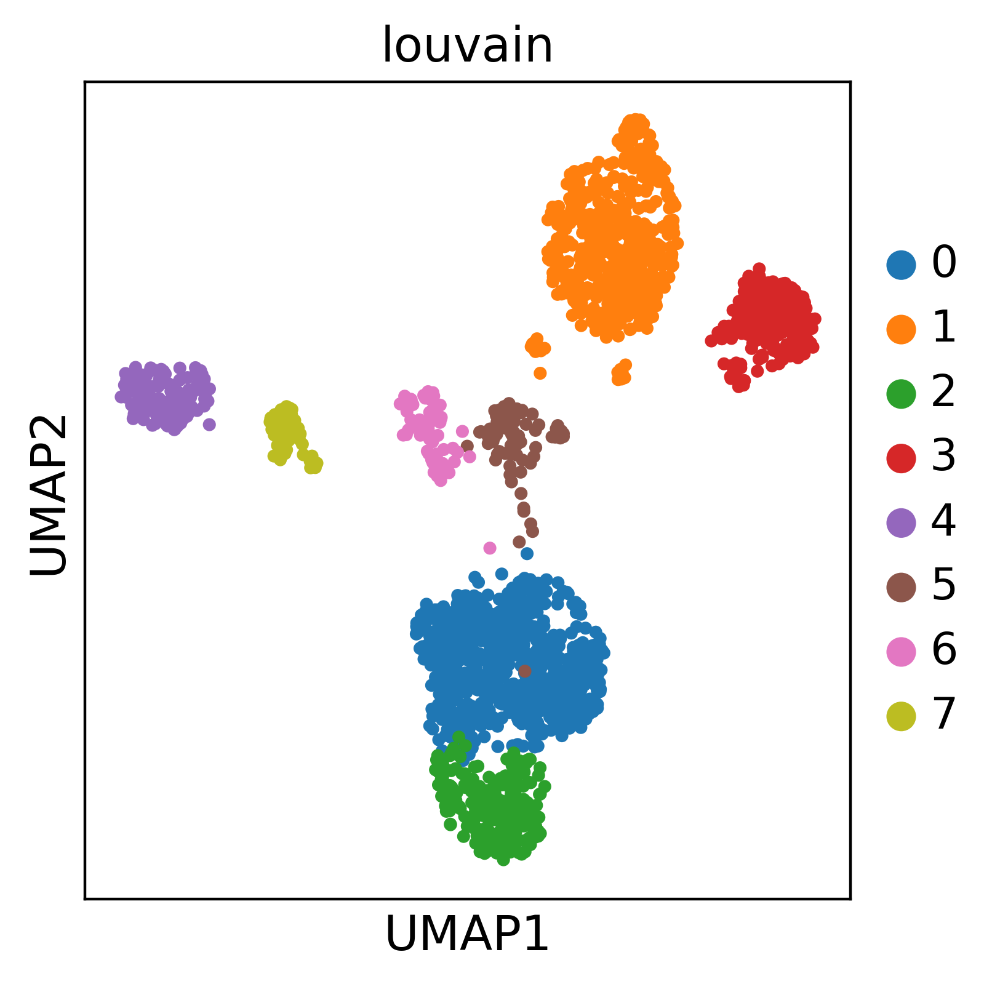

In [148]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss_facs, color=['louvain'], right_margin=0.5)

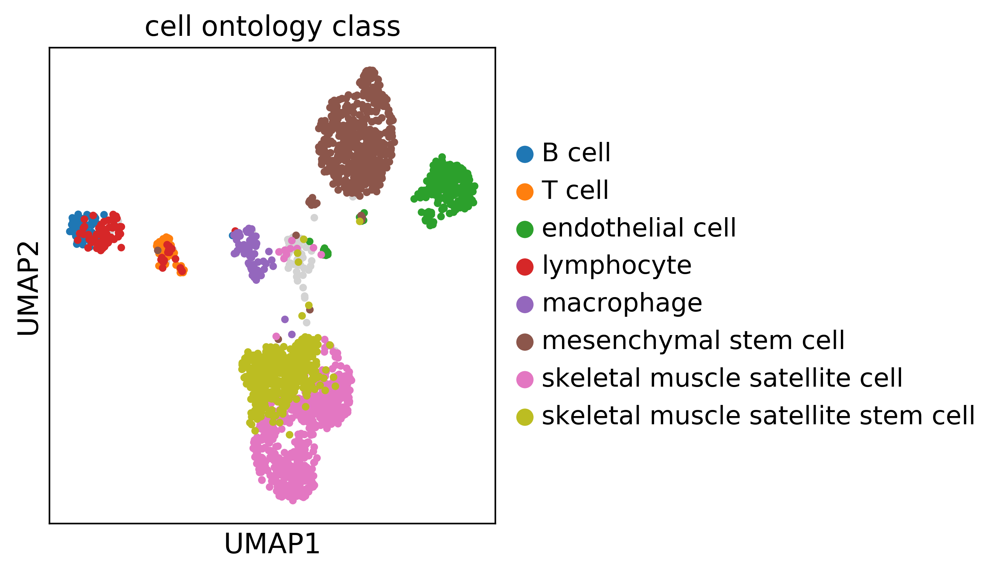

In [149]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss_facs, color=['cell_ontology_class'], right_margin=0.5)

In [150]:
sc.tl.tsne(tiss_facs, perplexity=50)

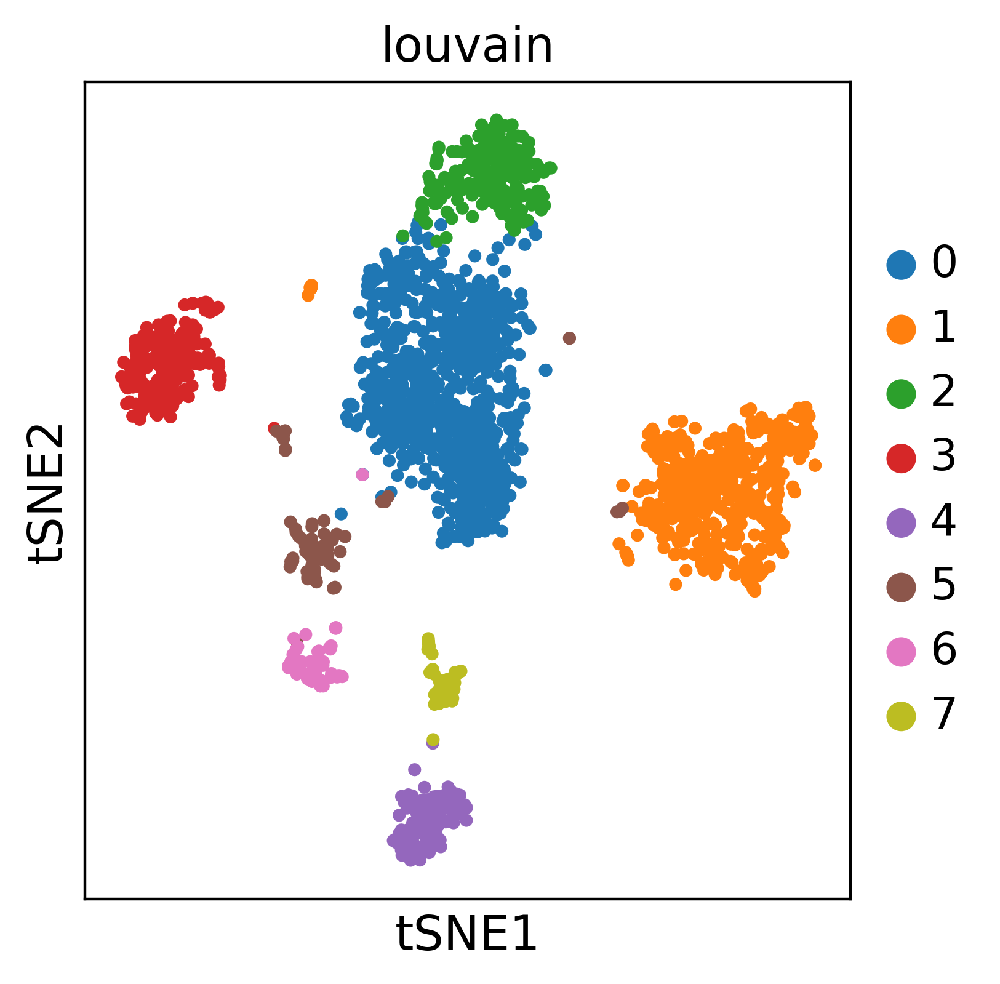

In [151]:
sc.settings.set_figure_params(dpi=200)
sc.pl.tsne(tiss_facs, color=['louvain'], right_margin=0.5)

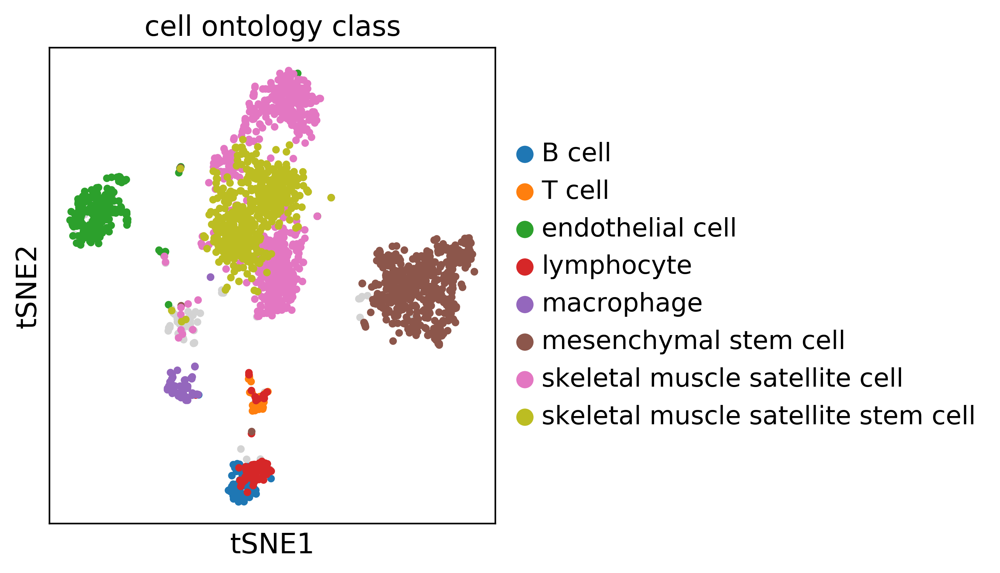

In [152]:
sc.settings.set_figure_params(dpi=200)
sc.pl.tsne(tiss_facs, color=['cell_ontology_class'], right_margin=0.5)

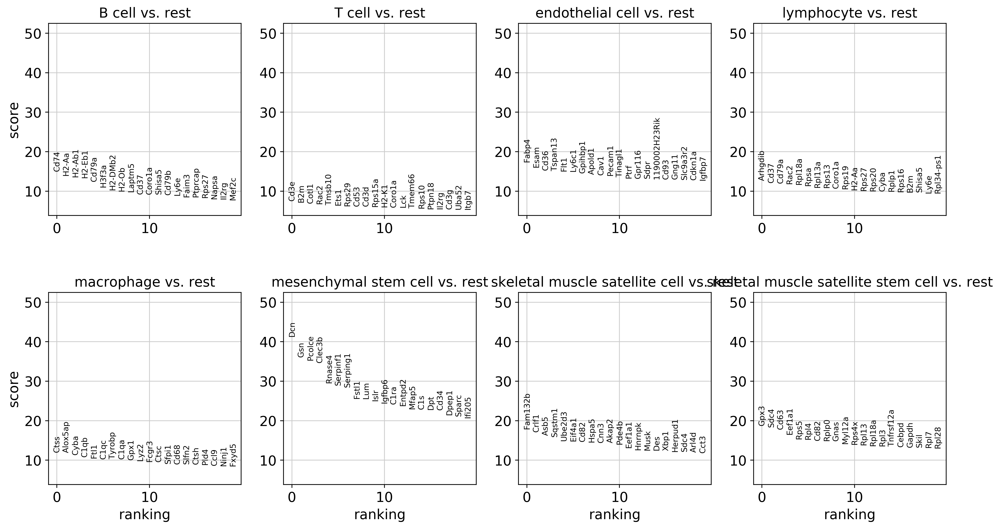

In [153]:
sc.tl.rank_genes_groups(tiss_facs, 'cell_ontology_class')
#,groups=['skeletal muscle satellite cell','skeletal muscle satellite stem cell'])
sc.pl.rank_genes_groups(tiss_facs, n_genes=20)

In [155]:
tiss_unkownclusters, set(tiss.obs['louvain'])


(array([ 1.,  4.,  6.,  9., 10., 12.]),
 {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12})

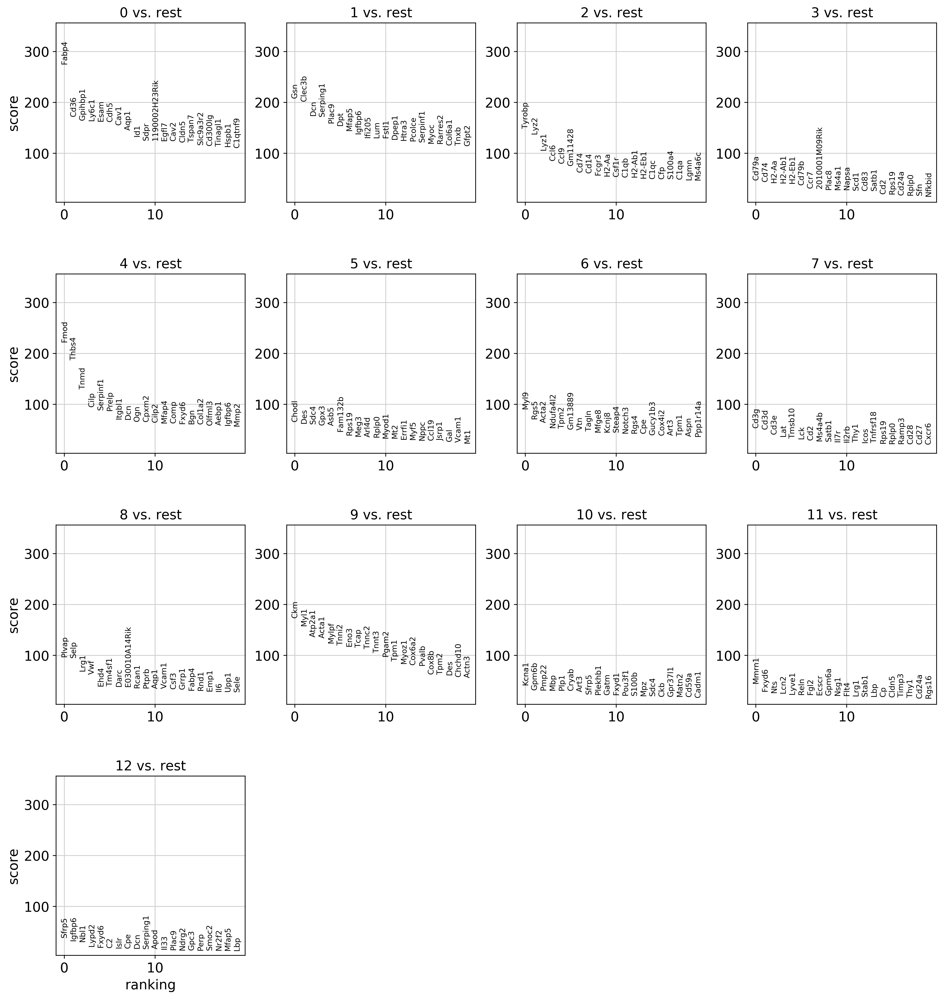

In [217]:
sc.tl.rank_genes_groups(tiss, 'louvain')#, groups= tiss_unkownclusters)
sc.pl.rank_genes_groups(tiss, n_genes=20)#, save='louvain_clusters_top_genes.pdf')
#adata.write(results_file)

In [ ]:
sc.pl.rank_genes_groups_violin(tiss, n_genes=8, groups=['1'])

In [ ]:
#sc.tl.rank_genes_groups(tiss, 'louvain', method='logreg')
sc.pl.rank_genes_groups(tiss, n_genes=20)

### Show the 10 top ranked genes per cluster in a dataframe.

In [218]:
tiss_cluster_genes = pd.DataFrame(tiss.uns['rank_genes_groups']['names'])
# cols = ['3m','18m','21m','24m']
# cluster_genes = cluster_genes[cols]
tiss_cluster_genes.head(15)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,Fabp4,Gsn,Tyrobp,Cd79a,Fmod,Chodl,Myl9,Cd3g,Plvap,Ckm,Kcna1,Mmrn1,Sfrp5
1,Cd36,Clec3b,Lyz2,Cd74,Thbs4,Des,Rgs5,Cd3d,Selp,Myl1,Gpm6b,Fxyd6,Igfbp6
2,Gpihbp1,Dcn,Lyz1,H2-Aa,Tnmd,Sdc4,Acta2,Cd3e,Lrg1,Atp2a1,Pmp22,Nts,Nbl1
3,Ly6c1,Serping1,Ccl6,H2-Ab1,Cilp,Gpx3,Ndufa4l2,Lat,Vwf,Acta1,Mbp,Lcn2,Lypd2
4,Esam,Plac9,Ccl9,H2-Eb1,Serpinf1,Asb5,Tpm2,Tmsb10,Ehd4,Mylpf,Plp1,Lyve1,Fxyd6
5,Cdh5,Dpt,Gm11428,Cd79b,Prelp,Fam132b,Gm13889,Lck,Tm4sf1,Tnni2,Cryab,Reln,C2
6,Cav1,Mfap5,Cd74,Ccr7,Itgbl1,Rps19,Vtn,Cd2,Darc,Eno3,Art3,Fgl2,Islr
7,Aqp1,Igfbp6,Cd14,2010001M09Rik,Dcn,Meg3,Tagln,Ms4a4b,E030010A14Rik,Tcap,Sfrp5,Ecscr,Cpe
8,Id1,Ifi205,Fcgr3,Plac8,Ogn,Arl4d,Mfge8,Satb1,Rcan1,Tnnc2,Plekhb1,Gpm6a,Dcn
9,Sdpr,Lum,H2-Aa,Ms4a1,Cpxm2,Rplp0,Kcnj8,Il7r,Ptprb,Tnnt3,Gatm,Nsg1,Serping1


In [160]:
tiss_facs_cluster_genes = pd.DataFrame(tiss_facs.uns['rank_genes_groups']['names'])
tiss_facs_cluster_genes.head(15)

,B cell,T cell,endothelial cell,lymphocyte,macrophage,mesenchymal stem cell,skeletal muscle satellite cell,skeletal muscle satellite stem cell
0,Cd74,Cd3e,Fabp4,Arhgdib,Ctss,Dcn,Fam132b,Gpx3
1,H2-Aa,B2m,Esam,Cd37,Alox5ap,Gsn,Crlf1,Sdc4
2,H2-Ab1,Cotl1,Cd36,Cd79a,Cyba,Pcolce,Asb5,Cd63
3,H2-Eb1,Rac2,Tspan13,Rac2,C1qb,Clec3b,Sqstm1,Eef1a1
4,Cd79a,Tmsb10,Flt1,Rpl18a,Ftl1,Rnase4,Ube2d3,Rps5
5,H3f3a,Ets1,Ly6c1,Rpsa,C1qc,Serpinf1,Eif4a1,Rpl4
6,H2-DMb2,Rps29,Gpihbp1,Rpl13a,Tyrobp,Serping1,Cd82,Cd82
7,H2-Ob,Cd53,Apold1,Rps13,C1qa,Fstl1,Hspa5,Rplp0
8,Laptm5,Cd3d,Cav1,Coro1a,Gpx1,Lum,Cnn3,Gnas
9,Cd37,Rps15a,Pecam1,Rps19,Lyz2,Islr,Akap2,Myl12a


In [209]:
tiss_cell_ontology_class,tiss_cell_ontology_class[index[2]]

({0: 'endothelial cell',
  1: 'nan',
  2: 'macrophage',
  3: 'B cell',
  4: 'nan',
  5: 'skeletal muscle satellite cell',
  6: 'nan',
  7: 'T cell',
  8: 'endothelial cell',
  9: 'nan',
  10: 'nan',
  11: 'endothelial cell',
  12: 'nan'},
 'nan')

In [234]:
cols = list(tiss_facs_cluster_genes.columns)
tiss_cell_ontology_class_round2 = pd.DataFrame(columns = cols)
index = tiss_unkownclusters
tiss_cell_ontology_class_round2 = tiss_cell_ontology_class_round2.reindex(index)

for i in range(0,len(tiss_unkownclusters)):
    clust = tiss_cluster_genes[str(int(index[i]))]
    
    for j in range(0,len(tiss_facs_cluster_genes.columns)):
        aux = sum(tiss_facs_cluster_genes.iloc[:,j].isin(clust))/len(clust)*100
        tiss_cell_ontology_class_round2[cols[j]][index[i]] = aux
        
        if aux > 50:
            tiss_cell_ontology_class[index[i]] = cols[j]
        
# # tiss_cell_ontology_class

tiss_cell_ontology_class_round2


,B cell,T cell,endothelial cell,lymphocyte,macrophage,mesenchymal stem cell,skeletal muscle satellite cell,skeletal muscle satellite stem cell
1.0,1,1,0,1,0,51,2,4
4.0,0,0,1,0,1,26,4,7
6.0,0,0,6,0,0,3,1,3
9.0,0,0,0,0,0,0,2,1
10.0,0,0,0,0,1,4,1,4
12.0,1,0,3,0,1,13,2,3


In [214]:
tiss.obs['cell_ontology_class'] = tiss.obs['louvain'].map(tiss_cell_ontology_class)
tiss.obs.head()

,tissue,subtissue,age,sex,n_genes,channel,cell_ontology_class,batch,cell,method,n_counts,louvain,free_annotation,cluster_names
index,,,,,,,,,,,,,,
AAACCTGAGAAACCGC-1-14-0,Limb_Muscle,Pre-Sort,18m,female,2506,MACA_18m_F_MUSCLE_50_pre_sort,macrophage,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGAGAAACCGC,droplet,7596.0,2,nan,macrophage_2
AAACCTGAGCAGCGTA-1-14-0,Limb_Muscle,Pre-Sort,18m,female,564,MACA_18m_F_MUSCLE_50_pre_sort,endothelial cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGAGCAGCGTA,droplet,890.0,0,nan,endothelial cell_0
AAACCTGCAATAACGA-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1361,MACA_18m_F_MUSCLE_50_pre_sort,endothelial cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGCAATAACGA,droplet,3351.0,0,nan,endothelial cell_0
AAACCTGCAGCGTAAG-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1482,MACA_18m_F_MUSCLE_50_pre_sort,nan,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGCAGCGTAAG,droplet,4630.0,4,chondrocyte-like,cluster4
AAACCTGGTAGCTTGT-1-14-0,Limb_Muscle,Pre-Sort,18m,female,1652,MACA_18m_F_MUSCLE_50_pre_sort,mesenchymal stem cell,0,MACA_18m_F_MUSCLE_50_pre_sort_AAACCTGGTAGCTTGT,droplet,3838.0,1,nan,cluster1


... storing 'cell_ontology_class' as categorical


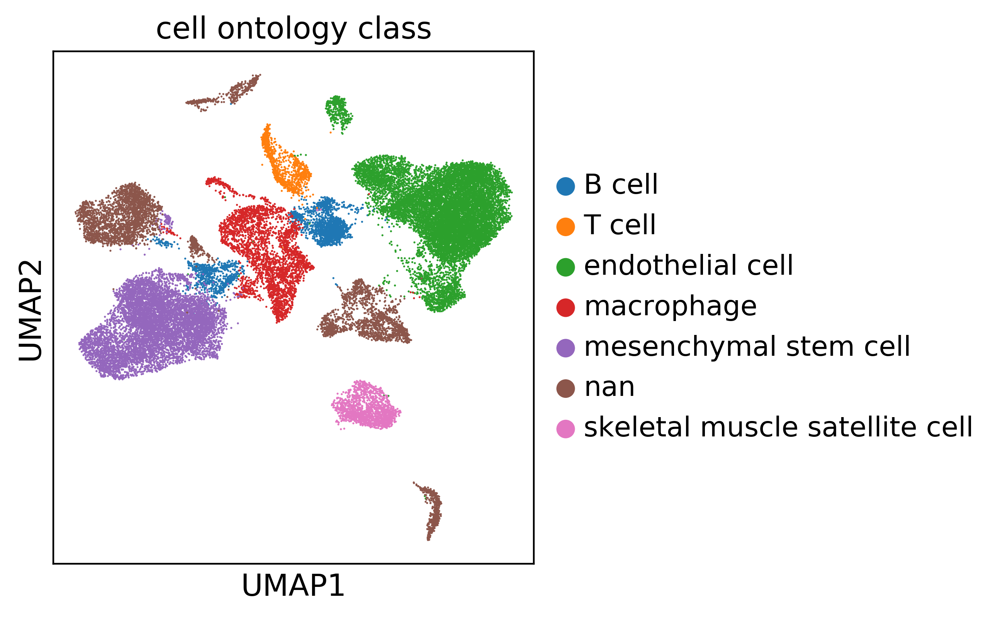

In [215]:
sc.pl.umap(tiss, color=['cell_ontology_class'], right_margin=0.5)

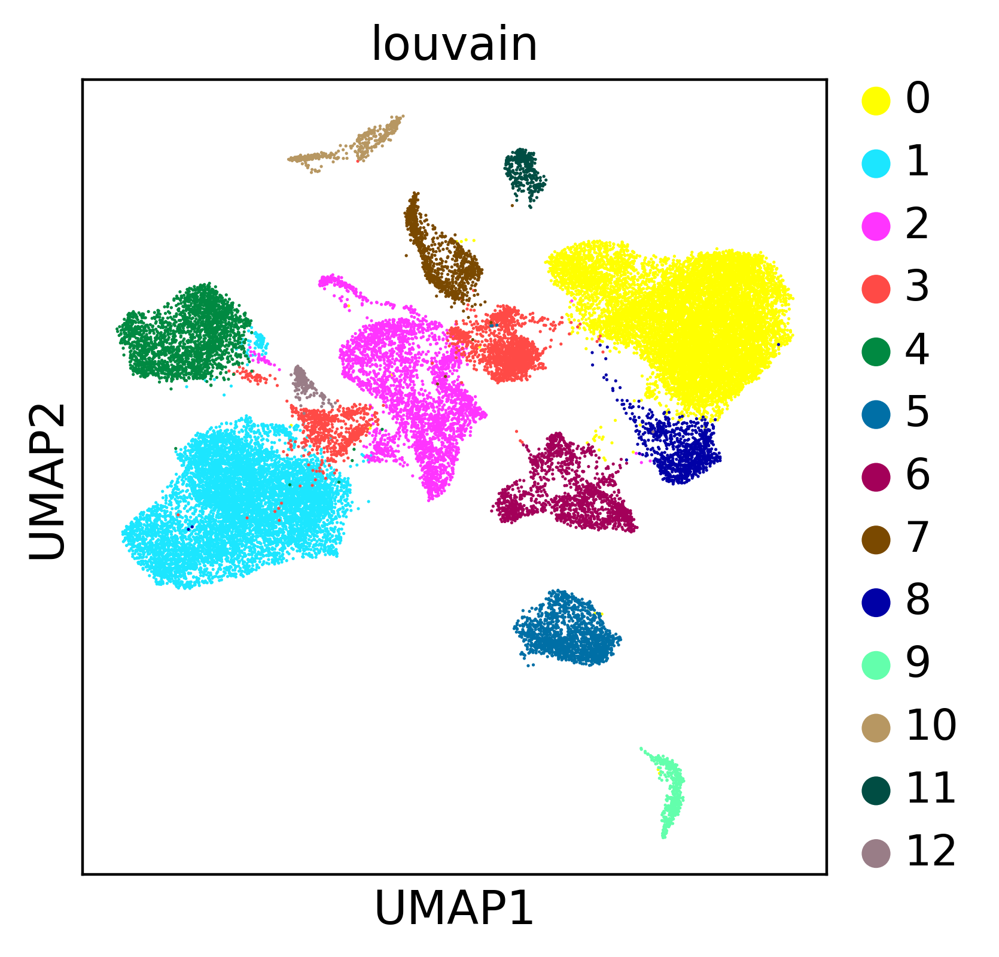

In [216]:
sc.pl.umap(tiss, color=['louvain'], right_margin=0.5)

In [212]:
tiss_unkownclusters_round2 = []
for i in range(0,len(tiss_cell_ontology_class)):
    if tiss_cell_ontology_class[i] == 'nan':
        tiss_unkownclusters_round2 = np.append(tiss_unkownclusters_round2,i)

tiss_unkownclusters_round2

array([ 4.,  6.,  9., 10., 12.])

In [434]:
cols = list(tiss_facs_cluster_genes.columns)
tiss_cell_ontology_class_dists = pd.DataFrame(columns = cols)
tiss_cell_ontology_class_pearcor = pd.DataFrame(columns = cols)
index = list(new_cluster_names.values())#list(set(tiss.obs['cluster_names']))#list(new_cluster_names.values())#tiss_unkownclusters
tiss_cell_ontology_class_dists = tiss_cell_ontology_class_dists.reindex(index)
tiss_cell_ontology_class_pearcor = tiss_cell_ontology_class_pearcor.reindex(index)
idxmin_dists = []
idxmax_pearcor = []
cluster_flags = []
cluster_flags_aux = []
new_cluster_names2 = deepcopy(new_cluster_names)
for i in range(0,len(list(set(tiss.obs['cluster_names'])))):#len(tiss_unkownclusters)):
    tiss_subset = tiss[tiss.obs['cluster_names'] == index[i]]#int(tiss_unkownclusters[i])]
    tiss_subset = pd.DataFrame(tiss_subset.X.todense().transpose(), columns=tiss_subset.obs_names, index=tiss_subset.var_names)
    tiss_subset = tiss_subset.sort_index()
    
    for j in range(0,len(tiss_facs_cluster_genes.columns)):
        tiss_facs_subset = tiss_facs[tiss_facs.obs['cell_ontology_class'] == cols[j]]#[:]#[:, :]
        tiss_facs_subset = pd.DataFrame(tiss_facs_subset.X.todense().transpose(), columns=tiss_facs_subset.obs_names, index=tiss_facs_subset.var_names)
        tiss_facs_subset = tiss_facs_subset[tiss_facs_subset.index.isin(tiss_subset.index)]

        tiss_subset_aux = tiss_subset[tiss_subset.index.isin(tiss_facs_subset.index)]
        
        pearcor = pearsonr(tiss_facs_subset.mean(axis = 1),tiss_subset_aux.mean(axis = 1))
        
        tiss_facs_subset = np.asarray(tiss_facs_subset.mean(axis = 1)).reshape(-1, 1)
        tiss_subset_aux = np.asarray(tiss_subset_aux.mean(axis = 1)).reshape(-1, 1)
        pairdist = paired_distances(tiss_facs_subset,tiss_subset_aux,metric='euclidean')
        
        tiss_cell_ontology_class_pearcor[cols[j]][index[i]] = pearcor[0]
        tiss_cell_ontology_class_dists[cols[j]][index[i]] = mean(pairdist)
    
    idxmax_pearcor.append(np.asarray(tiss_cell_ontology_class_pearcor.loc[index[i]]).argmax())
    idxmin_dists.append(np.asarray(tiss_cell_ontology_class_dists.loc[index[i]]).argmin())
    
#     cluster_flags_aux.append(np.asarray(tiss_cell_ontology_class_dists[cols[j]]).argmax())

    if np.asarray(tiss_cell_ontology_class_pearcor.loc[index[i]]).argmax() != np.asarray(tiss_cell_ontology_class_dists.loc[index[i]]).argmin():
        cluster_flags.append(index[i])
        new_cluster_names2[i] = 'tbc_' + str(i)
    else:
        new_cluster_names2[i] = cols[np.asarray(tiss_cell_ontology_class_dists.loc[index[i]]).argmin()]

            
    

In [439]:
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: tomato' if v else '' for v in is_max]

def highlight_min(s):
    '''
    highlight the minimum in a Series yellow.
    '''
    is_max = s == s.min()
    return ['background-color: dodgerblue' if v else '' for v in is_min]

In [442]:
tiss_cell_ontology_class_dists.transpose().style.apply(highlight_min)

,endothelial cell_0,mesenchymal stem cell_1,macrophage_2,tbc_3,mesenchymal stem cell_4,skeletal muscle satellite cell_5,cluster6,endothelial cell_7,T cell_8,endothelial cell_9,cluster10,tbc_11,endothelial cell_12
B cell,0.519951,0.464462,0.336111,0.196518,0.487838,0.288519,0.501549,0.536954,0.218548,0.578829,0.339039,0.37945,0.443171
T cell,0.601639,0.552351,0.441799,0.320223,0.575089,0.381682,0.58454,0.620836,0.166909,0.666037,0.436561,0.468385,0.535929
endothelial cell,0.158401,0.592659,0.567467,0.459831,0.630462,0.492275,0.52267,0.297136,0.497608,0.341774,0.586885,0.519771,0.378248
lymphocyte,0.54665,0.488572,0.350822,0.217914,0.511431,0.312826,0.523673,0.560446,0.185379,0.602469,0.363635,0.403594,0.469112
macrophage,0.71919,0.657394,0.22934,0.429176,0.684336,0.508999,0.701474,0.736065,0.453208,0.757122,0.575996,0.588921,0.629886
mesenchymal stem cell,0.536029,0.158532,0.430193,0.250653,0.314827,0.325674,0.449807,0.530488,0.365959,0.562774,0.457988,0.375315,0.434401
skeletal muscle satellite cell,0.44654,0.359331,0.320873,0.18164,0.379582,0.115724,0.39922,0.460256,0.221687,0.49414,0.294832,0.288583,0.367534
skeletal muscle satellite stem cell,0.448563,0.363639,0.314311,0.17405,0.381504,0.140909,0.397963,0.463949,0.211152,0.49827,0.282564,0.283122,0.367545


In [ ]:
tiss_cell_ontology_class_pearcor.transpose().style.apply(highlight_max)

In [435]:
new_cluster_names

{0: 'endothelial cell_0',
 1: 'mesenchymal stem cell_1',
 2: 'macrophage_2',
 3: 'tbc_3',
 4: 'mesenchymal stem cell_4',
 5: 'skeletal muscle satellite cell_5',
 6: 'cluster6',
 7: 'endothelial cell_7',
 8: 'T cell_8',
 9: 'endothelial cell_9',
 10: 'cluster10',
 11: 'tbc_11',
 12: 'endothelial cell_12'}

In [436]:
new_cluster_names2

{0: 'endothelial cell',
 1: 'mesenchymal stem cell',
 2: 'macrophage',
 3: 'tbc_3',
 4: 'mesenchymal stem cell',
 5: 'skeletal muscle satellite cell',
 6: 'tbc_6',
 7: 'endothelial cell',
 8: 'T cell',
 9: 'endothelial cell',
 10: 'tbc_10',
 11: 'tbc_11',
 12: 'tbc_12'}

/home/ubuntu/anaconda3/lib/python3.6/site-packages/scanpy/utils.py:643: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if groups_order_subset != 'all':


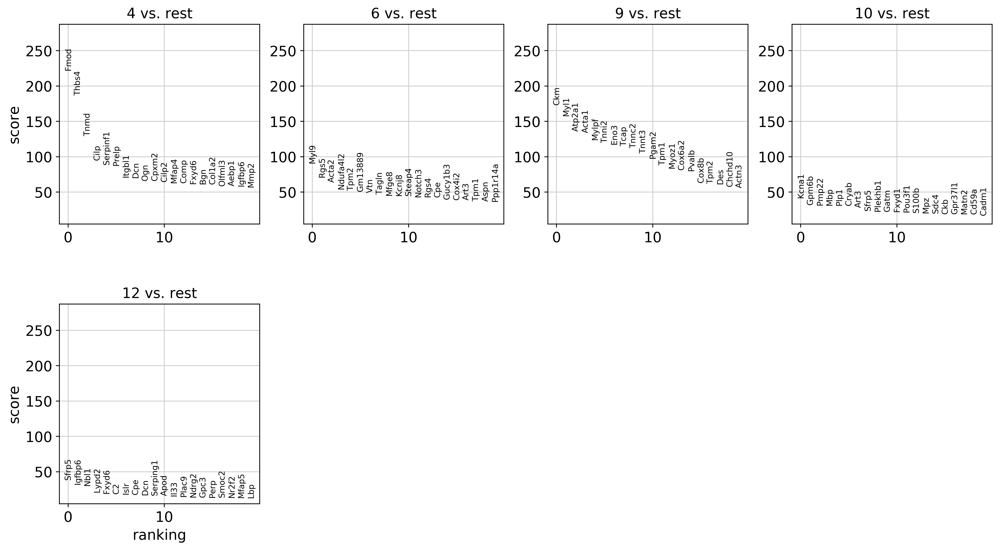

,4,6,9,10,12
0,Fmod,Myl9,Ckm,Kcna1,Sfrp5
1,Thbs4,Rgs5,Myl1,Gpm6b,Igfbp6
2,Tnmd,Acta2,Atp2a1,Pmp22,Nbl1
3,Cilp,Ndufa4l2,Acta1,Mbp,Lypd2
4,Serpinf1,Tpm2,Mylpf,Plp1,Fxyd6
5,Prelp,Gm13889,Tnni2,Cryab,C2
6,Itgbl1,Vtn,Eno3,Art3,Islr
7,Dcn,Tagln,Tcap,Sfrp5,Cpe
8,Ogn,Mfge8,Tnnc2,Plekhb1,Dcn
9,Cpxm2,Kcnj8,Tnnt3,Gatm,Serping1


In [213]:
sc.tl.rank_genes_groups(tiss, 'louvain', groups= tiss_unkownclusters_round2)
sc.pl.rank_genes_groups(tiss, n_genes=20)#, save='louvain_clusters_top_genes.pdf')
tiss_cluster_genes = pd.DataFrame(tiss.uns['rank_genes_groups']['names'])
tiss_cluster_genes.head(15)

# Look for GO terms

checkout http://nbviewer.jupyter.org/urls/dessimozlab.github.io/go-handbook/GO%20Tutorial%20in%20Python%20-%20Solutions.ipynb

In [ ]:
from goatools import obo_parser
import wget
import os


In [ ]:
go_obo_url = 'http://purl.obolibrary.org/obo/go/go-basic.obo'
data_folder = './write'

# Check if we have the ./data directory already
if(not os.path.isfile(data_folder)):
    # Emulate mkdir -p (no error if folder exists)
    try:
        os.mkdir(data_folder)
    except OSError as e:
        if(e.errno != 17):
            raise e
else:
    raise Exception('Data path (' + data_folder + ') exists as a file. '
                   'Please rename, remove or change the desired location of the data path.')

# Check if the file exists already
if(not os.path.isfile(data_folder+'/go-basic.obo')):
    go_obo = wget.download(go_obo_url, data_folder+'/go-basic.obo')
else:
    go_obo = data_folder+'/go-basic.obo'
    
print(go_obo)

In [ ]:
# Get http://geneontology.org/ontology/go-basic.obo
from goatools.base import download_go_basic_obo
obo_fname = download_go_basic_obo()

In [ ]:
# Get ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz
from goatools.base import download_ncbi_associations
gene2go = download_ncbi_associations()

In [ ]:
from goatools.associations import read_gaf

In [ ]:
from goatools.obo_parser import GODag

obodag = GODag("go-basic.obo")

In [ ]:
from __future__ import print_function
from goatools.associations import read_ncbi_gene2go

geneid2gos_mouse = read_ncbi_gene2go("gene2go", taxids=[10090])

print("{N:,} annotated mouse genes".format(N=len(geneid2gos_mouse)))

In [ ]:
from goatools.test_data.genes_NCBI_10090_ProteinCoding import GeneID2nt as GeneID2nt_mus

## read genes of interest
https://github.com/AllenInstitute/swdb_2017_tools/blob/9330fae0a1f9b75b7fb998c5e0d51c488588bf0b/projects/mustache_whales/python_notbooks/GO_termAnalysis_GOATOOLS.ipynb

In [ ]:
# import mygene

# mg = mygene.MyGeneInfo()
# out = mg.querymany(cluster_genes['3m'], scopes='symbol', fields='entrezgene', species='mouse')

# newdict={}
# for k,v in [(key,d[key]) for d in out for key in d]:
#     if k not in newdict: newdict[k]=[v]
#     else: 
#         newdict[k].append(v)

# geneid2symbol = {}
# keys = list(newdict['entrezgene'])
# values = list(newdict['query'])
# geneid2symbol = dict(zip(keys, values))

In [ ]:
tiss.var_names

In [ ]:
import sys
import os
import pandas as pd
import mygene
# from unpack_dict_to_col_pd import unpack
mg = mygene.MyGeneInfo()

In [ ]:
#read in gene symbols:
ephys_genes = cluster_genes['24m'] #pd.read_csv('/Volumes/Brain2017/project/GO_term_analysis_ephys/top_ephys/top_ephys_genes_fine.csv', index_col = 0)

#remove r squared columns:
# cols = [c for c in ephys_genes.columns if c.lower()[:2] != 'r_']
ephys_symbol = ephys_genes#[cols]
ephys_symbol = pd.DataFrame(ephys_symbol)

#convert gene symbols to entrezgene ids, remove NAs and save to dictionary for each for each ephys measure
output = {}
for c in ephys_symbol.columns:
    out = mg.querymany(ephys_symbol[c], scopes='symbol', fields='entrezgene', species='mouse')
    out = pd.DataFrame(out)
    out = out.dropna(subset = ['entrezgene'])
    out.entrezgene = out.entrezgene.astype(int)
    entrezgene = out.entrezgene
    #filter for protein coding genes:
    entrezgene = entrezgene[entrezgene.isin(GeneID2nt_mus.keys())].dropna()
    output[c] = entrezgene
    


In [ ]:
out = mg.querymany(ephys_genes, scopes='symbol', fields='entrezgene', species='mouse')
df = pd.DataFrame(out,columns=['query','_id','_score','entrezgene'])
# df = df.loc[:,['query','entrezgene']]
geneid2symbol = {}
for r in range(df.shape[0]):
    if df['_id'][r] == df['entrezgene'][r]:
        geneid2symbol[int(df['entrezgene'][r])] = df['query'][r]

In [ ]:
# 'p_' means "pvalue". 'fdr_bh' is the multipletest method we are currently using.
goea_results_sig_dict = {}
for key in output.keys():
    # 'p_' means "pvalue". 'fdr_bh' is the multipletest method we are currently using.
    #geneids_study = geneid2symbol.keys()
    geneids_study = output[key]
    goea_results_all = goeaobj.run_study(geneids_study)
    goea_results_sig = [r for r in goea_results_all if r.p_fdr_bh < 0.05]
    goeaobj.wr_xlsx('./write/' + tissofinterest + '_' + str(key) + '_vs_3m_' + "GOEA_resultsFine_sig.xlsx", goea_results_sig)    

    goea_results_sig_dict[key] = goea_results_sig

In [ ]:
from __future__ import print_function
go_names = [r.name for r in goea_results_sig]
print(len(go_names)) # Includes ONLY signficant results

In [ ]:
import collections as cx
word2cnt = cx.Counter([word for name in go_names for word in name.split()])
print(word2cnt.most_common(10))

In [ ]:
freq_seen = ['RNA', 'translation', 'mitochond', 'ribosomal', 'ribosome',
             'adhesion', 'endoplasmic', 'nucleotide', 'apoptotic',
             'inflammation','immune','MHC',
             'growth','differentiation']

freq_seen = ['adhesion','apoptotic','immune','MHC','growth','differentiation']

# Collect significant GOs for words in freq_seen (unordered)
word2siggos = cx.defaultdict(set)
# Loop through manually curated words of interest
for word in freq_seen:
    # Check each significant GOEA result for the word of interest
    for rec in goea_results_sig:
        if word in rec.name:
            word2siggos[word].add(rec.GO)
# Sort word2gos to have the same order as words in freq_seen
word2siggos = cx.OrderedDict([(w, word2siggos[w]) for w in freq_seen])

In [ ]:
goid2goobj_all = {nt.GO:nt.goterm for nt in goea_results_all}
print(len(goid2goobj_all))

In [ ]:
# Plot set of GOs for each frequently seen word
from goatools.godag_plot import plot_goid2goobj
for word, gos in word2siggos.items():
    goid2goobj = {go:goid2goobj_all[go] for go in gos}
    plot_goid2goobj(
        "24m_vs_3m_word_{WORD}.png".format(WORD=word),
        goid2goobj, # source GOs to plot and their GOTerm object
        study_items=15, # Max number of gene symbols to print in each GO term
        id2symbol=geneid2symbol, # Contains GeneID-to-Symbol from Step 1
        goea_results=goea_results_all, # pvals used for GO Term coloring
        dpi=150)

In [ ]:
fout = "24m_vs_3m_GO_word_genes.txt"
go2res = {nt.GO:nt for nt in goea_results_all}
with open(fout, "w") as prt:
    prt.write("""This file is generated by test_nbt3102.py and is intended to confirm
this statement in the GOATOOLS manuscript:

        We observed:
            93 genes associated with RNA,
            47 genes associated with translation,
            70 genes associated with mitochondrial or mitochondrian, and
            37 genes associated with ribosomal, as reported by GOATOOLS.

""")
    for word, gos in word2siggos.items():
        # Sort first by BP, MF, CC. Sort second by GO id.
        gos = sorted(gos, key=lambda go: [go2res[go].NS, go])
        genes = set()
        for go in gos:
            genes |= go2res[go].study_items
        genes = sorted([geneid2symbol[g] for g in genes])
        prt.write("\n{WD}: {N} study genes, {M} GOs\n".format(WD=word, N=len(genes), M=len(gos)))
        prt.write("{WD} GOs: {GOs}\n".format(WD=word, GOs=", ".join(gos)))
        for i, go in enumerate(gos):
            res = go2res[go]
            prt.write("{I}) {NS} {GO} {NAME} ({N} genes)\n".format(
                I=i, NS=res.NS, GO=go, NAME=res.name, N=res.study_count))
        prt.write("{N} study genes:\n".format(N=len(genes)))
        N = 10 # Number of genes per line
        mult = [genes[i:i+N] for i in range(0, len(genes), N)]
        prt.write("  {}\n".format("\n  ".join([", ".join(str(g) for g in sl) for sl in mult])))
    print("  WROTE: {F}\n".format(F=fout))

In [ ]:
from goatools.godag_plot import plot_gos, plot_results, plot_goid2goobj

plot_results("./figures/nbt3102_{NS}.png", goea_results_sig)

In [ ]:
goid_subset = [
    'GO:0003723', # MF D04 RNA binding (32 genes)
    'GO:0044822', # MF D05 poly(A) RNA binding (86 genes)
    'GO:0003729', # MF D06 mRNA binding (11 genes)
    'GO:0019843', # MF D05 rRNA binding (6 genes)
    'GO:0003746', # MF D06 translation elongation factor activity (5 genes)
]
plot_gos("nbt3102_MF_RNA_genecnt.png", 
    goid_subset, # Source GO ids
    obodag, 
    goea_results=goea_results_all) # Use pvals for coloring

In [ ]:
plot_gos("nbt3102_MF_RNA_Symbols.png", 
    goid_subset, # Source GO ids
    obodag,
    goea_results=goea_results_all, # use pvals for coloring
    # We can further configure the plot...
    id2symbol=geneid2symbol, # Print study gene Symbols, not Entrez GeneIDs
    study_items=6, # Only only 6 gene Symbols max on GO terms
    items_p_line=3, # Print 3 genes per line
    )

# GSEA analysis

In [ ]:
import gseapy as gp

In [ ]:
names = list(gp.get_library_name())
names

In [ ]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set no_plot=True

# list, dataframe, series inputs are supported
enr = gp.enrichr(gene_list=cluster_genes['24m'],
                 # or gene_list='./gene_list.txt', or gene_list=glist
                 description='24m vs 3m enrich',
                 gene_sets='Reactome_2016',
#                  outdir='./write/enrichr_' + '3m' + 'Aging_up',
                 cutoff=0.5 # test dataset, use lower value of range(0,1)
                )

enr.res2d.head()

In [ ]:
gp.plot.barplot(enr.res2d, cutoff=0.05, figsize=(6.5, 6), top_term=10, color='salmon', title='24m vs 3m')

In [ ]:
gp.plot.barplot(enr.res2d, cutoff=0.05, figsize=(6.5, 6), top_term=10, color='salmon', title='3m Limb_Muscle Aging_UP')

### Get a table with scores and groups.



In [ ]:
result = tiss.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(5)

In [ ]:
sc.pl.violin(tiss, ['Cdkn2a','Myoc','Gpx3'],groupby='Age', rotation=90)#, save='.pdf')

In [ ]:

sc.pl.violin(tiss[tiss.obs['Age']=='3m',:], ['Cdkn2a'],groupby='cell_ontology_class',rotation=90)#, save='.pdf')


In [ ]:
sc.pl.violin(tiss[tiss.obs['Age']=='18m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)#, save='.pdf')


In [ ]:
sc.pl.violin(tiss[tiss.obs['Age']=='21m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)#, save='.pdf')


In [ ]:
sc.pl.violin(tiss[tiss.obs['Age']=='24m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)#, save='.pdf')


In [ ]:
def _build_subplots(n):
    '''
    Build subplots grid
    n: number of subplots
    '''
    nrow = int(np.sqrt(n))
    ncol = int(np.ceil(n / nrow))
    fig, axs = plt.subplots(nrow, ncol, dpi=100, figsize=(ncol*5, nrow*5))
    fig.subplots_adjust(hspace=.9)

    return fig, axs, nrow, ncol

In [ ]:
list(set(tiss.obs['Age']))

In [ ]:
ages = ['3m','18m','24m']#,'21m'

fig, axs, nrow, ncol = _build_subplots(len(ages))

axs = axs.ravel()

for i in range(nrow*ncol):
    age = ages[i]
    axs[i].set_title(ages[i])
    sc.pl.violin(tiss[tiss.obs['Age']==ages[i],:], ['Cdkn2a'],
                 groupby='cell_ontology_class', 
                 rotation=90,
                 ax=axs[i],show=False)

fig.savefig('figures/%s_p16.pdf' % tissofinterest, bbox_inches='tight')

In [ ]:
f, axarr = plt.subplots(2,2)
axarr[0,0] = sc.pl.violin(tiss[tiss.obs['Age']=='24m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)
#axarr[0,1].sc.pl.violin(tiss[tiss.obs['Age']=='24m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)
#axarr[1,0].sc.pl.violin(tiss[tiss.obs['Age']=='24m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)
#axarr[1,1].sc.pl.violin(tiss[tiss.obs['Age']=='24m',:], ['Cdkn2a'],groupby='cell_ontology_class', rotation=90)

In [ ]:
sc.pl.scatter(n_genes, n_cells,color='Age', rotation=90)#, save='.pdf')


In [ ]:
sc.tl.rank_genes_groups(tiss, 'cell_ontology_class')
sc.pl.rank_genes_groups(tiss, n_genes=20, save='cell_types_top_genes.pdf')

In [ ]:
sc.tl.rank_genes_groups(tiss, 'age')
sc.pl.rank_genes_groups(tiss, n_genes=20, save='age_top_genes.pdf')

### subset for cell ontology

In [ ]:
tiss.obs[tiss.obs['cell_ontology_class'] == tiss.obs['cell_ontology_class'][1]].head()

In [ ]:
subtiss = tiss[tiss.obs['cell_ontology_class'] == tiss.obs['cell_ontology_class'][3],:]
sc.tl.rank_genes_groups(subtiss, 'Age', groups=['24m'], reference='3m')#, method='logreg')
sc.pl.rank_genes_groups(subtiss, n_genes=20, groups=['24m'], save='subtiss_louvain_clusters_top_genes.pdf')

In [ ]:
sc.pl.rank_genes_groups(subtiss, n_genes=20, save='subtiss_louvain_clusters_top_genes.pdf')

## Force-directed graph

In [ ]:
sc.tl.draw_graph(adata) # be patient here...

In [ ]:
sc.pl.draw_graph(adata, color=['Tissue'])

In [ ]:
sc.pl.draw_graph(adata, color=['Age'])

In [ ]:
sc.pl.draw_graph(adata, color=['Sex'])

In [ ]:
sc.pl.draw_graph(adata, color=['louvain'])

# Pseudotime analysis

In [ ]:
sc.pp.neighbors(adata)


In [ ]:
sc.tl.diffmap(adata)

In [ ]:
sc.tl.dpt(adata, n_branchings=1)

In [ ]:
#sc.pl.diffmap(adata, color=['dpt_pseudotime', 'dpt_groups', 'age'])

In [ ]:
#sc.pl.diffmap(adata, color=['dpt_pseudotime'])

In [ ]:
#sc.pl.diffmap(adata, color=['dpt_groups'])

In [ ]:
#sc.pl.diffmap(adata, color=['Age'])

# Save processed data

In [ ]:
tiss.write('./write/maca-droplet.processed_' +  tissofinterest + '.h5ad')

In [ ]:
def export_to_csv(adata, prefix):
    pd.DataFrame(adata.X, index = adata.obs_names, columns=adata.var_names).to_csv('./write/maca-droplet.processed_' +  prefix + '-expression.csv')
    adata.obs.to_csv('./write/maca-droplet.processed_' +  prefix + '-metadata.csv')

In [ ]:
export_to_csv(tiss,tissofinterest)